In [1]:
!pip install copent

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import time
import warnings
warnings.filterwarnings('ignore')

import statsmodels.api as sm
from statsmodels.tsa.stattools import adfuller, grangercausalitytests
from statsmodels.stats.diagnostic import acorr_ljungbox
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.seasonal import STL
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.statespace.varmax import VARMAX
from copent import transent

from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import train_test_split, ParameterGrid
from sklearn.gaussian_process import GaussianProcessRegressor

import tensorflow as tf
import keras.layers as layers

import torch
from torch import nn, optim

from itertools import product
import pickle as pkl
from tqdm.notebook import tqdm

%matplotlib inline

In [ ]:
strategy = tf.distribute.MirroredStrategy()

## Input Data

In [4]:
store_sales = pd.read_csv('../input/eco-dataset/train.csv', header=0, parse_dates=[0])
store_sales['date'] = pd.to_datetime(store_sales['date'])
store_sales = store_sales.set_index('id')

store_sales.head()

,date,store_nbr,family,sales,onpromotion
id,,,,,
0,2013-01-01,1,AUTOMOTIVE,0.0,0
1,2013-01-01,1,BABY CARE,0.0,0
2,2013-01-01,1,BEAUTY,0.0,0
3,2013-01-01,1,BEVERAGES,0.0,0
4,2013-01-01,1,BOOKS,0.0,0


### Data Preprocessing

In [5]:
store_sales = store_sales.drop(columns=['store_nbr', 'onpromotion'])
store_sales['family'] = store_sales['family'].str.replace(r'\s+', '_', regex=True)

store_sales.head(10)

,date,family,sales
id,,,
0,2013-01-01,AUTOMOTIVE,0.0
1,2013-01-01,BABY_CARE,0.0
2,2013-01-01,BEAUTY,0.0
3,2013-01-01,BEVERAGES,0.0
4,2013-01-01,BOOKS,0.0
5,2013-01-01,BREAD/BAKERY,0.0
6,2013-01-01,CELEBRATION,0.0
7,2013-01-01,CLEANING,0.0
8,2013-01-01,DAIRY,0.0


In [6]:
unique_families = store_sales['family'].unique()
family_dfs = {}

for family in unique_families:
    family_dfs[family] = store_sales[store_sales['family'] == family]

In [7]:
combined_df = pd.concat(family_dfs.values(), ignore_index=True)
pivot_df = combined_df.pivot_table(index='date', columns='family', values='sales', aggfunc='sum')
pivot_df.columns = [f'sales_{col}' for col in pivot_df.columns]

pivot_df = pivot_df.reset_index()

pivot_df.head()

,date,sales_AUTOMOTIVE,sales_BABY_CARE,sales_BEAUTY,sales_BEVERAGES,sales_BOOKS,sales_BREAD/BAKERY,sales_CELEBRATION,sales_CLEANING,sales_DAIRY,...,sales_MAGAZINES,sales_MEATS,sales_PERSONAL_CARE,sales_PET_SUPPLIES,sales_PLAYERS_AND_ELECTRONICS,sales_POULTRY,sales_PREPARED_FOODS,sales_PRODUCE,sales_SCHOOL_AND_OFFICE_SUPPLIES,sales_SEAFOOD
0,2013-01-01,0.0,0.0,2.0,810.0,0.0,180.58900,0.0,186.0,143.0,...,0.0,110.801000,25.0,0.0,0.0,42.637000,37.847000,0.0,0.0,0.000000
1,2013-01-02,255.0,0.0,207.0,72092.0,0.0,26246.31900,0.0,74629.0,23381.0,...,0.0,20871.464028,17204.0,0.0,0.0,13975.884938,5338.111976,0.0,0.0,1526.750002
2,2013-01-03,161.0,0.0,125.0,52105.0,0.0,18456.48002,0.0,55893.0,18001.0,...,0.0,16597.398113,12568.0,0.0,0.0,10674.393983,3591.388005,0.0,0.0,1094.310994
3,2013-01-04,169.0,0.0,133.0,54167.0,0.0,16721.96901,0.0,52064.0,18148.0,...,0.0,21625.963055,11303.0,0.0,0.0,10772.515038,4472.965990,0.0,0.0,1293.120995
4,2013-01-05,342.0,0.0,191.0,77818.0,0.0,22367.76108,0.0,70128.0,23082.0,...,0.0,20879.091050,16819.0,0.0,0.0,13475.009055,5830.073020,0.0,0.0,1245.637004


### Data Visualization

In [8]:
def plot_ts(data, label):
    sns.lineplot(data=data, x='date', y=label)
    plt.title(label)
    plt.ylabel('')
    plt.xlabel('')

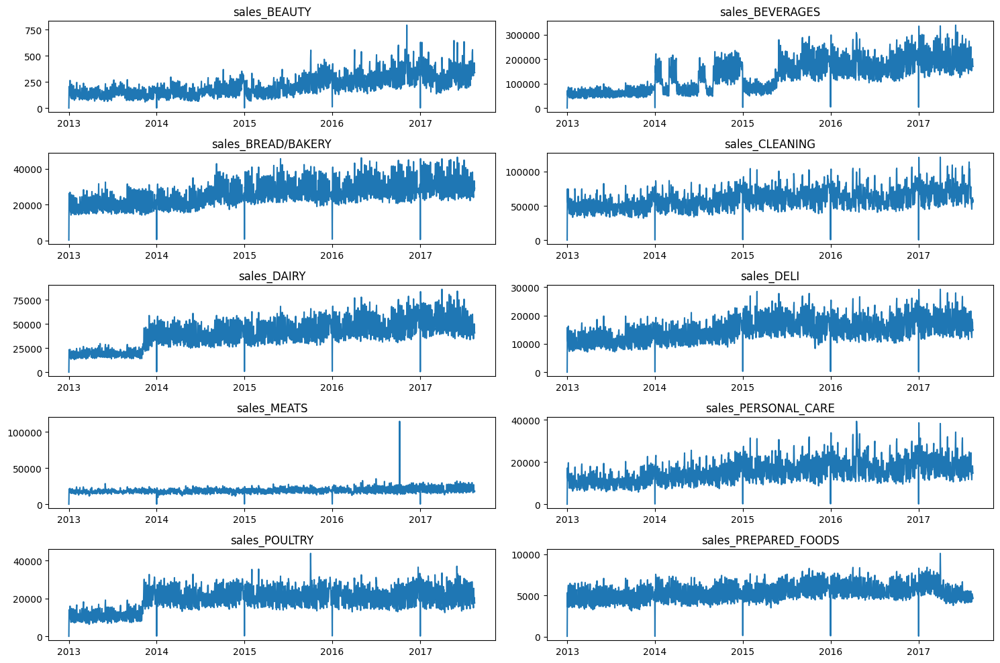

In [9]:
plt.figure(figsize=(15, 10))

cols = ['sales_BEAUTY', 'sales_BEVERAGES', 'sales_BREAD/BAKERY', 'sales_CLEANING', 'sales_DAIRY', 'sales_DELI', 'sales_MEATS', 'sales_PERSONAL_CARE', 'sales_POULTRY', 'sales_PREPARED_FOODS']

for i in range(0, 10):
    plt.subplot(5, 2, i + 1)
    plot_ts(pivot_df, cols[i])

plt.tight_layout()
plt.show()

In [10]:
data = pivot_df[cols]
data.insert(loc=0,
           column='date',
           value=pivot_df['date'])
train = data.loc[data['date'] < '2017-01-01']
valid = data.loc[(data['date'] >= '2017-01-01') & (data['date'] < '2017-04-01')]
train.head()

,date,sales_BEAUTY,sales_BEVERAGES,sales_BREAD/BAKERY,sales_CLEANING,sales_DAIRY,sales_DELI,sales_MEATS,sales_PERSONAL_CARE,sales_POULTRY,sales_PREPARED_FOODS
0,2013-01-01,2.0,810.0,180.58900,186.0,143.0,71.09000,110.801000,25.0,42.637000,37.847000
1,2013-01-02,207.0,72092.0,26246.31900,74629.0,23381.0,15754.50000,20871.464028,17204.0,13975.884938,5338.111976
2,2013-01-03,125.0,52105.0,18456.48002,55893.0,18001.0,11172.45500,16597.398113,12568.0,10674.393983,3591.388005
3,2013-01-04,133.0,54167.0,16721.96901,52064.0,18148.0,10143.20900,21625.963055,11303.0,10772.515038,4472.965990
4,2013-01-05,191.0,77818.0,22367.76108,70128.0,23082.0,13734.94501,20879.091050,16819.0,13475.009055,5830.073020


In [11]:
dec25 = list()
for year in range(2013, 2017):
    dec25 += [{'date': pd.Timestamp(f'{year}-12-25'), 
               'sales_BEAUTY': train.loc[(train['date'] == f'{year}-12-18'), 'sales_BEAUTY'].values[0],
               'sales_BEVERAGES': train.loc[(train['date'] == f'{year}-12-18'), 'sales_BEVERAGES'].values[0],
               'sales_BREAD/BAKERY': train.loc[(train['date'] == f'{year}-12-18'), 'sales_BREAD/BAKERY'].values[0],
               'sales_CLEANING': train.loc[(train['date'] == f'{year}-12-18'), 'sales_CLEANING'].values[0],
               'sales_DAIRY': train.loc[(train['date'] == f'{year}-12-18'), 'sales_DAIRY'].values[0],
               'sales_DELI': train.loc[(train['date'] == f'{year}-12-18'), 'sales_DELI'].values[0],
               'sales_MEATS': train.loc[(train['date'] == f'{year}-12-18'), 'sales_MEATS'].values[0],
               'sales_PERSONAL_CARE': train.loc[(train['date'] == f'{year}-12-18'), 'sales_PERSONAL_CARE'].values[0],
               'sales_POULTRY': train.loc[(train['date'] == f'{year}-12-18'), 'sales_POULTRY'].values[0],
               'sales_PREPARED_FOODS': train.loc[(train['date'] == f'{year}-12-18'), 'sales_PREPARED_FOODS'].values[0]
              }]
train = pd.concat([train, pd.DataFrame(dec25)], ignore_index=True).sort_values('date').reset_index()

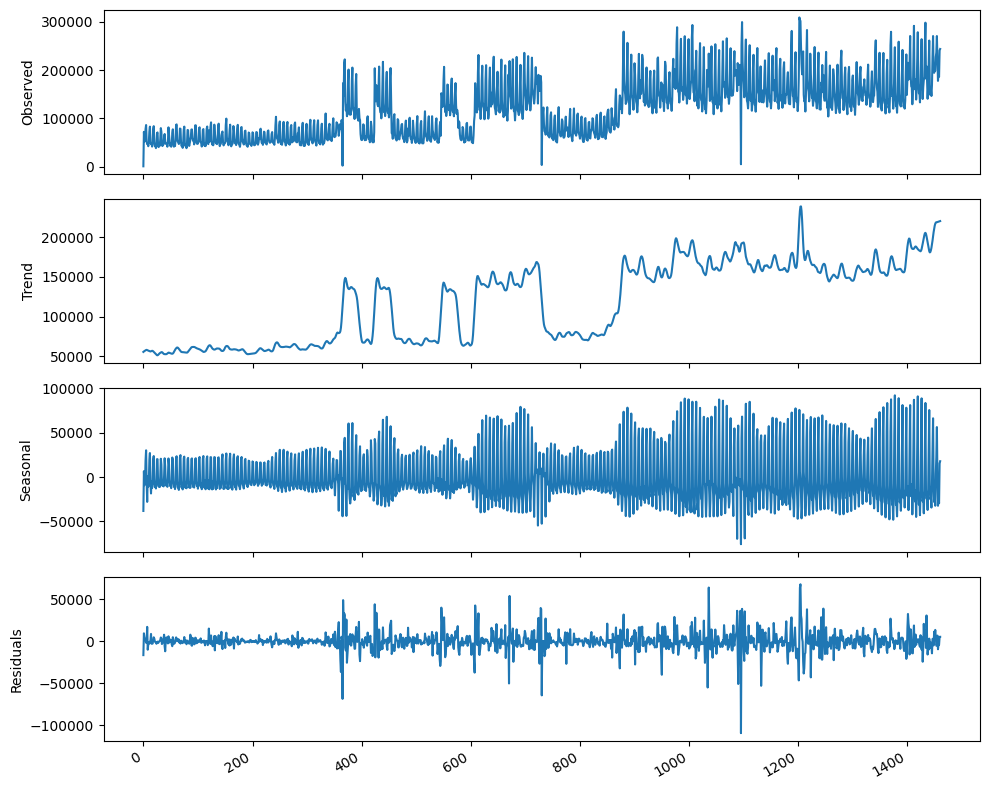

In [12]:
decomposition = STL(train['sales_BEVERAGES'], period=7).fit()

fig, (ax1, ax2, ax3, ax4) = plt.subplots(nrows=4, ncols=1, sharex=True, figsize=(10,8))

ax1.plot(decomposition.observed)
ax1.set_ylabel('Observed')

ax2.plot(decomposition.trend)
ax2.set_ylabel('Trend')

ax3.plot(decomposition.seasonal)
ax3.set_ylabel('Seasonal')

ax4.plot(decomposition.resid)
ax4.set_ylabel('Residuals')

fig.autofmt_xdate()
plt.tight_layout()

### Split & Scale Data

In [13]:
print(len(train))
print(len(valid))
print(len(train)*80/100)

1461
90
1168.8


In [14]:
train_df = train[:1168].drop(columns=['index', 'date'])
test_df = train[1168:].drop(columns=['index', 'date'])

In [ ]:
scalers = {}
scaler = MinMaxScaler(feature_range=(-1, 1))

scaled_train = train_df
for i in train_df.columns:
    scaler = MinMaxScaler(feature_range=(-1, 1))
    s_s = scaler.fit_transform(scaled_train[i].values.reshape(-1, 1))
    s_s = np.reshape(s_s, len(s_s))
    scalers['scaler_' + i] = scaler
    scaled_train[i] = s_s
    
scaled_test = test_df
for i in test_df.columns:
    s_s = scaler.fit_transform(scaled_test[i].values.reshape(-1, 1))
    s_s = np.reshape(s_s, len(s_s))
    scalers['scaler_' + i] = scaler
    scaled_test[i] = s_s

## SARIMAX

### Find the optimize hyperparameters

In [ ]:
def optimize_SARIMAX(endog, exog, order_list, d, D, s):
    results = []
    for order in tqdm(order_list):
        try:
            model = SARIMAX(
                endog, exog, 
                order=(order[0], d, order[1]), 
                seasonal_order=(order[2], D, order[3], s), 
                simple_differencing=False
            ).fit(disp=False)
            aic = model.aic
            results.append([order, aic])
        except:
            continue
    result_df = pd.DataFrame(results, columns=['(p,q,P,Q)', 'AIC'])
    result_df = result_df.sort_values(by='AIC', ascending=True).reset_index(drop=True)
    return result_df

In [ ]:
p = range(1, 4)
d = 1
q = range(1, 4)
P = range(1, 4)
D = 0
Q = range(1, 4)
s = 7
parameters = list(product(p, q, P, Q))

In [ ]:
def recursive_forecast(endog, exog, train_len, horizon, window, order, seasonal_order):
    pred_SARIMAX = []
    for i in range(train_len, train_len + horizon, window):
        try:
            model = SARIMAX(endog[:i], exog[:i], 
                            order=order, 
                            seasonal_order=seasonal_order, 
                            simple_differencing=False)
            res = model.fit(disp=False)
            predictions = res.get_prediction(exog=exog[i:i + window])
            oos_pred = predictions.predicted_mean.iloc[:window]
            pred_SARIMAX.extend(oos_pred)
        except:
            pred_SARIMAX.extend([np.nan] * window)
    return pred_SARIMAX[:horizon]

### Model training

In [ ]:
metrics = []
prediction_SARIMAX = []

# Loop through each variable as the target
for i, target_col in enumerate(scaled_train.columns):
    target = scaled_train[target_col]
    exog = scaled_train.drop(columns=[target_col])

    # Find best parameters for the SARIMAX model
    result_df = optimize_SARIMAX(target, exog, parameters, d, D, s)
    best_order = result_df.iloc[0]['(p,q,P,Q)']
    
    # Train SARIMAX with best parameters
    start = time.time()
    best_model = SARIMAX(target, exog, 
                         order=(best_order[0], d, best_order[1]), 
                         seasonal_order=(best_order[2], D, best_order[3], s), 
                         simple_differencing=False)
    best_model_fit = best_model.fit(disp=False)
    end = time.time()
    
    # Forecast on the test set
    target_test = scaled_test[target_col]
    exog_test = scaled_test.drop(columns=[target_col])
    train_len = len(target)
    horizon = len(target_test)
    window = 30
    
    pred_SARIMAX = recursive_forecast(target, exog, train_len, horizon, window, 
                                      (best_order[0], d, best_order[1]), 
                                      (best_order[2], D, best_order[3], s))
    
    # Compute performance metrics
    mse = mean_squared_error(target_test, pred_SARIMAX, squared=True)
    rmse = mean_squared_error(target_test, pred_SARIMAX, squared=False)
    mae = mean_absolute_error(target_test, pred_SARIMAX)
    r2 = r2_score(target_test, pred_SARIMAX)

    # Unscale predictions
    scaler = scalers[f'scaler_{target_col}']
    unscaled_SARIMAX = scaler.inverse_transform(
        np.array(pred_SARIMAX[:horizon]).reshape(-1, 1)
    )
    prediction_SARIMAX.append(unscaled_SARIMAX)
    
    # Unscaled target
    real_values = train.loc[1168:, target_col].values  # Adjust index as needed
    
    # Compute unscaled metrics
    unscale_mse = mean_squared_error(real_values, unscaled_SARIMAX)
    unscale_rmse = mean_squared_error(real_values, unscaled_SARIMAX, squared=False)
    unscale_mae = mean_absolute_error(real_values, unscaled_SARIMAX)
    
    
    # Store metrics
    metrics.append({
        'Variable': target_col,
        'Best Order': best_order,
        'MSE': mse,
        'RMSE': rmse,
        'MAE': mae,
        'Unscale MSE': unscale_mse,
        'Unscale RMSE': unscale_rmse,
        'Unscale MAE': unscale_mae,
        'R2': r2,
        'Time': end-start
    })

In [ ]:
metrics_df = pd.DataFrame(metrics)
print(metrics_df)

               Variable    Best Order       MSE      RMSE       MAE  \
0          sales_BEAUTY  [3, 1, 1, 1]  0.460567  0.678651  0.560684   
1       sales_BEVERAGES  [1, 2, 1, 1]  0.684454  0.827317  0.760577   
2    sales_BREAD/BAKERY  [2, 2, 3, 3]  0.310524  0.557247  0.472723   
3        sales_CLEANING  [1, 1, 3, 3]  0.243478  0.493435  0.384280   
4           sales_DAIRY  [1, 2, 3, 3]  0.902522  0.950012  0.877659   
5            sales_DELI  [3, 2, 2, 3]  0.293414  0.541677  0.443357   
6           sales_MEATS  [1, 1, 2, 3]  0.356420  0.597009  0.340810   
7   sales_PERSONAL_CARE  [1, 2, 2, 3]  0.292742  0.541056  0.428270   
8         sales_POULTRY  [2, 1, 2, 3]  0.293861  0.542090  0.480307   
9  sales_PREPARED_FOODS  [1, 2, 2, 2]  0.239395  0.489280  0.387636   

    Unscale MSE   Unscale RMSE    Unscale MAE        R2       Time  
0  3.495713e+04     186.968269     154.468358 -2.631418  32.201599  
1  1.523302e+10  123422.101848  113465.493578 -6.591169  31.055792  
2  1.601222

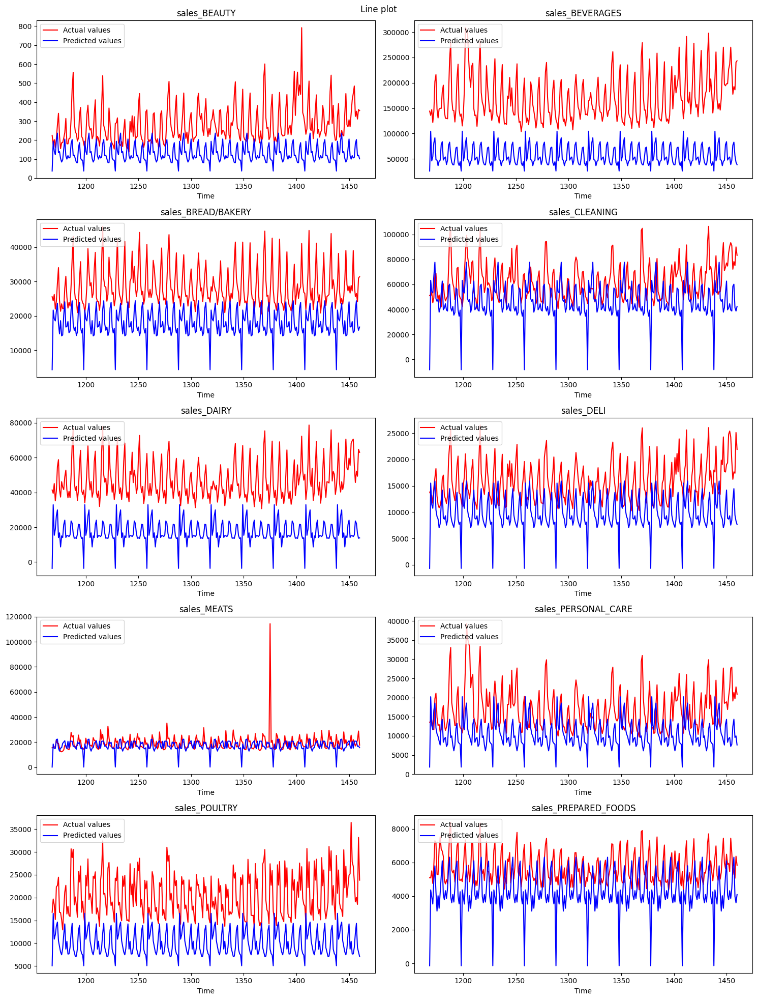

In [ ]:
plt.figure(figsize=(15, 20))
prediction_SARIMAX = np.array(prediction_SARIMAX)
for i in range(10):
    plt.subplot(5, 2, i + 1)  
    plt.plot(test_df.index, test_df.iloc[:, i], 'r-', markersize=10, label='Actual values')
    plt.plot(test_df.index, prediction_SARIMAX[i], 'b-', label='Predicted values')
    plt.xlabel('Time')
    plt.title(f'{test_df.columns[i]}')
    plt.legend(loc='upper left')

plt.suptitle('Line plot')
plt.tight_layout()
plt.show()

## Gaussian Process

In [39]:
statistic = []
p_value = []
for i in range(10):
    ad_fuller_result = adfuller(scaled_train[scaled_train.columns[i]])
    statistic.append(ad_fuller_result[0])
    p_value.append(round(ad_fuller_result[1], 5))
    
ADF_res = pd.DataFrame({'Statistic': statistic, 'P-value': p_value}, index=scaled_train.columns)
ADF_res

,Statistic,P-value
sales_BEAUTY,-2.583382,0.09648
sales_BEVERAGES,-2.493775,0.11700
sales_BREAD/BAKERY,-1.472145,0.54724
sales_CLEANING,-3.481215,0.00848
sales_DAIRY,-1.384791,0.58955
sales_DELI,-1.951839,0.30808
sales_MEATS,-5.872383,0.00000
sales_PERSONAL_CARE,-2.753199,0.06528
sales_POULTRY,-1.926672,0.31962
sales_PREPARED_FOODS,-2.361816,0.15280


In [40]:
diff_data = scaled_train.diff()
diff_data = diff_data.iloc[1:, :]

statistic = []
p_value = []
for i in range(10):
    ad_fuller_result = adfuller(diff_data[diff_data.columns[i]])
    statistic.append(ad_fuller_result[0])
    p_value.append(round(ad_fuller_result[1], 5))
    
ADF_res = pd.DataFrame({'Statistic': statistic, 'P-value': p_value}, index=diff_data.columns)
ADF_res

,Statistic,P-value
sales_BEAUTY,-10.078650,0.0
sales_BEVERAGES,-7.710860,0.0
sales_BREAD/BAKERY,-11.375610,0.0
sales_CLEANING,-10.872004,0.0
sales_DAIRY,-10.050339,0.0
sales_DELI,-11.673613,0.0
sales_MEATS,-11.559999,0.0
sales_PERSONAL_CARE,-11.759874,0.0
sales_POULTRY,-11.712611,0.0
sales_PREPARED_FOODS,-13.168108,0.0


In [41]:
train_Gaussian = diff_data
test_Gaussian = scaled_test

In [42]:
X_train = train_Gaussian.index.values.reshape(-1, 1)
y_train = train_Gaussian.values

X_test = test_Gaussian.index.values.reshape(-1, 1)
y_test = test_Gaussian.values

print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)

(1167, 1) (1167, 10) (293, 1) (293, 10)


### Define model

In [43]:
from sklearn.gaussian_process.kernels import RationalQuadratic, ExpSineSquared, WhiteKernel, RBF

kernel = (7.07**2 * RBF(length_scale=7) + 
          1.41**2 * RBF(length_scale=14) * ExpSineSquared(length_scale=1, periodicity=7) + 
          0.707**2 * RationalQuadratic(alpha=1, length_scale=1))

In [44]:
start = time.time()
gp = GaussianProcessRegressor(kernel=kernel, n_restarts_optimizer=10)
gp.fit(X_train, y_train)
end = time.time()

In [45]:
gp

GaussianProcessRegressor(kernel=7.07**2 * RBF(length_scale=7) + 1.41**2 * RBF(length_scale=14) * ExpSineSquared(length_scale=1, periodicity=7) + 0.707**2 * RationalQuadratic(alpha=1, length_scale=1),
                         n_restarts_optimizer=10)

In [46]:
print(gp.score(X_train, y_train))
print(end-start)

1.0
641.8345673084259


In [47]:
def unscale(data):
    temp = data.copy()
    for index, i in enumerate(train_df.columns):
        scaler = scalers['scaler_' + i]
        temp[:, index] = scaler.inverse_transform(np.reshape(data[:, index], (-1, 1))).flatten()
    return temp

In [48]:
y_pred, sigma = gp.predict(X_test, return_std=True)
last_value = scaled_train.iloc[-1, :].values
y_pred = y_pred.cumsum(axis=0) + last_value

In [49]:
y_pred_unscale = unscale(y_pred)
sigma_unscale = unscale(sigma)

In [50]:
pred_scaled_Gau = pd.DataFrame(data=y_pred, columns=train.drop(columns=['index', 'date']).columns)
pred_scaled_Gau.head()

,sales_BEAUTY,sales_BEVERAGES,sales_BREAD/BAKERY,sales_CLEANING,sales_DAIRY,sales_DELI,sales_MEATS,sales_PERSONAL_CARE,sales_POULTRY,sales_PREPARED_FOODS
0,-0.335379,0.018845,0.159537,-0.048846,0.287403,-0.101450,0.116922,-0.221094,-0.230398,0.171345
1,-0.348898,-0.063469,0.077024,-0.102503,0.198378,-0.168820,0.077283,-0.277201,-0.258428,0.131294
2,-0.394010,-0.060022,0.100470,-0.113719,0.276557,-0.219682,0.066817,-0.311056,-0.249342,0.204293
3,-0.465164,-0.188440,-0.041892,-0.259074,0.065609,-0.281017,0.124750,-0.441425,-0.349126,0.083793
4,-0.445748,-0.098204,0.018736,-0.203215,0.164923,-0.140498,0.571764,-0.419627,0.020628,0.226815


In [51]:
pred_Gau = pd.DataFrame(y_pred_unscale, columns=train.drop(columns=['index', 'date']).columns)
pred_Gau.head()

,sales_BEAUTY,sales_BEVERAGES,sales_BREAD/BAKERY,sales_CLEANING,sales_DAIRY,sales_DELI,sales_MEATS,sales_PERSONAL_CARE,sales_POULTRY,sales_PREPARED_FOODS
0,185.103143,152804.801503,26511.307764,49685.978048,44061.465941,12809.029205,15940.730906,13195.516270,16855.291575,4861.696734
1,181.378706,140525.015259,24637.606362,46893.552207,41024.460748,11853.995010,15378.927756,12246.806575,16242.946164,4696.696393
2,168.950214,141039.219964,25170.025349,46309.817614,43691.481736,11132.970032,15230.602426,11674.357061,16441.442917,4997.431159
3,149.347346,121881.338050,21937.278379,38745.287505,36495.180501,10263.468286,16051.672155,9469.948430,14261.571932,4501.008287
4,154.696478,135343.094172,23314.019826,41652.301851,39883.168249,12255.486905,22387.109893,9838.529113,22339.176777,5090.212301


### Model Evaluation
#### Scaled data


In [52]:
for i in range(10):
    print(f'MSE for {scaled_test.columns[i]}: {mean_squared_error(scaled_test.iloc[:, i], pred_scaled_Gau.iloc[:, i])}')
    
print(f'MSE total: {mean_squared_error(scaled_test, pred_scaled_Gau)}')

MSE for sales_BEAUTY: 0.12183897325273615
MSE for sales_BEVERAGES: 0.033598570423145194
MSE for sales_BREAD/BAKERY: 0.0159183799135521
MSE for sales_CLEANING: 0.1456124666854924
MSE for sales_DAIRY: 0.031493071469885475
MSE for sales_DELI: 0.11554992222925069
MSE for sales_MEATS: 0.17133003970701308
MSE for sales_PERSONAL_CARE: 0.14292872915391286
MSE for sales_POULTRY: 0.045324177540703205
MSE for sales_PREPARED_FOODS: 0.01868381466213084
MSE total: 0.08422781450378221


In [53]:
for i in range(10):
    print(f'RMSE for {scaled_test.columns[i]}: {mean_squared_error(scaled_test.iloc[:, i], pred_scaled_Gau.iloc[:, i], squared=False)}')
    
print(f'RMSE total: {mean_squared_error(scaled_test, pred_scaled_Gau, squared=False)}')

RMSE for sales_BEAUTY: 0.3490543987013144
RMSE for sales_BEVERAGES: 0.18329912826619005
RMSE for sales_BREAD/BAKERY: 0.12616806217720908
RMSE for sales_CLEANING: 0.38159201601382126
RMSE for sales_DAIRY: 0.17746287349720638
RMSE for sales_DELI: 0.33992634824216067
RMSE for sales_MEATS: 0.4139203301445981
RMSE for sales_PERSONAL_CARE: 0.37805916091785535
RMSE for sales_POULTRY: 0.21289475695916799
RMSE for sales_PREPARED_FOODS: 0.13668875104459344
RMSE total: 0.26990658259641165


In [54]:
for i in range(10):
    print(f'MAE for {scaled_test.columns[i]}: {mean_absolute_error(scaled_test.iloc[:, i], pred_scaled_Gau.iloc[:, i])}')
    
print(f'MAE total: {mean_absolute_error(scaled_test, pred_scaled_Gau)}')

MAE for sales_BEAUTY: 0.26385247238946186
MAE for sales_BEVERAGES: 0.1274171545734781
MAE for sales_BREAD/BAKERY: 0.0987393627408089
MAE for sales_CLEANING: 0.3163370681505436
MAE for sales_DAIRY: 0.14451770348861662
MAE for sales_DELI: 0.2808701656979505
MAE for sales_MEATS: 0.15528541097761497
MAE for sales_PERSONAL_CARE: 0.2862574289193635
MAE for sales_POULTRY: 0.16691686192366084
MAE for sales_PREPARED_FOODS: 0.10033860894594261
MAE total: 0.1940532237807442


In [55]:
for i in range(10):
    print(f'R2 for {scaled_test.columns[i]}: {r2_score(scaled_test.iloc[:, i], pred_scaled_Gau.iloc[:, i])}')
    
print(f'R2 total: {r2_score(scaled_test, pred_scaled_Gau)}')

R2 for sales_BEAUTY: 0.03933965406658246
R2 for sales_BEVERAGES: 0.6273637105102278
R2 for sales_BREAD/BAKERY: 0.7352452896992925
R2 for sales_CLEANING: -0.9143933421592896
R2 for sales_DAIRY: 0.6710115693107903
R2 for sales_DELI: -0.6962201585477059
R2 for sales_MEATS: 0.2853394269021263
R2 for sales_PERSONAL_CARE: -0.33347632133536087
R2 for sales_POULTRY: 0.056741451597658865
R2 for sales_PREPARED_FOODS: 0.6000295528641713
R2 total: 0.10709808329084917


#### Unscaled data


In [56]:
for i in range(10):
    print(f'MSE for {scaled_test.columns[i]}: {mean_squared_error(test_df.iloc[:, i], pred_Gau.iloc[:, i])}')
    
print(f'MSE total: {mean_squared_error(test_df, pred_Gau)}')

MSE for sales_BEAUTY: 9247.608529625986
MSE for sales_BEVERAGES: 747760263.930158
MSE for sales_BREAD/BAKERY: 8208341.064184871
MSE for sales_CLEANING: 394372402.03244495
MSE for sales_DAIRY: 36650534.19317899
MSE for sales_DELI: 23221162.656705692
MSE for sales_MEATS: 34414817.99988568
MSE for sales_PERSONAL_CARE: 40865364.830284745
MSE for sales_POULTRY: 21630675.19147528
MSE for sales_PREPARED_FOODS: 317098.6656711282
MSE total: 130744990.81725188


In [57]:
for i in range(10):
    print(f'MAE for {scaled_test.columns[i]}: {mean_absolute_error(test_df.iloc[:, i], pred_Gau.iloc[:, i])}')
    
print(f'MAE total: {mean_absolute_error(test_df, pred_Gau)}')

MAE for sales_BEAUTY: 72.69135614329674
MAE for sales_BEVERAGES: 19008.537079312468
MAE for sales_BREAD/BAKERY: 2242.170240089
MAE for sales_CLEANING: 16462.813700690585
MAE for sales_DAIRY: 4930.076936810667
MAE for sales_DELI: 3981.6470710408403
MAE for sales_MEATS: 2200.8307055296373
MAE for sales_PERSONAL_CARE: 4840.326865597518
MAE for sales_POULTRY: 3646.4501705418847
MAE for sales_PREPARED_FOODS: 413.36386365024
MAE total: 5779.890798940614


In [58]:
for i in range(10):
    print(f'RMSE for {scaled_test.columns[i]}: {mean_squared_error(test_df.iloc[:, i], pred_Gau.iloc[:, i], squared=False)}')
    
print(f'RMSE total: {mean_squared_error(test_df, pred_Gau, squared=False)}')

RMSE for sales_BEAUTY: 96.16448684221211
RMSE for sales_BEVERAGES: 27345.20550169916
RMSE for sales_BREAD/BAKERY: 2865.0202554580433
RMSE for sales_CLEANING: 19858.811697391284
RMSE for sales_DAIRY: 6053.968466483699
RMSE for sales_DELI: 4818.834159493943
RMSE for sales_MEATS: 5866.414407445632
RMSE for sales_PERSONAL_CARE: 6392.602351960018
RMSE for sales_POULTRY: 4650.878969772841
RMSE for sales_PREPARED_FOODS: 563.1151442388388
RMSE total: 7851.101544078566


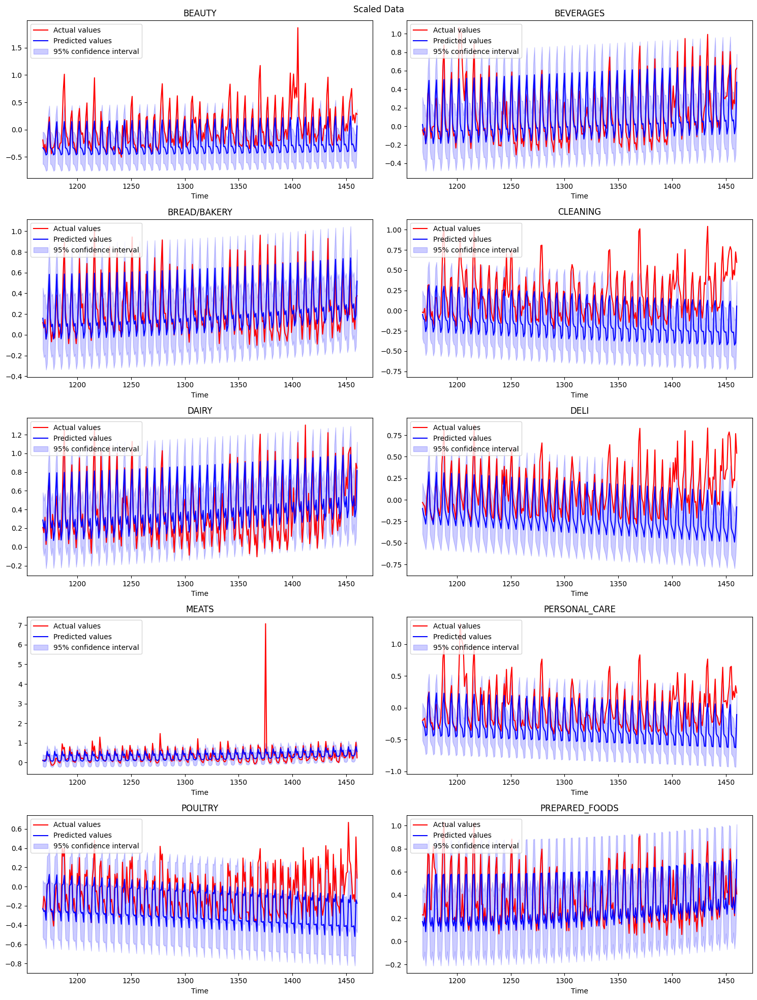

In [59]:
plt.figure(figsize=(15, 20))
for i in range(10):
    plt.subplot(5, 2, i + 1)  
    plt.plot(X_test, y_test[:, i], 'r-', markersize=10, label='Actual values')
    plt.plot(X_test, y_pred[:, i], 'b-', label='Predicted values')
    plt.fill_between(X_test.flatten(), y_pred[:, i] - 1.96 * sigma[:, i], y_pred[:, i] + 1.96 * sigma[:, i], alpha=0.2, color='blue', label='95% confidence interval')
    plt.xlabel('Time')
    plt.title(f'{train_Gaussian.columns[i][6:]}')
    plt.legend(loc='upper left')

plt.suptitle('Scaled Data')
plt.tight_layout()
plt.show()

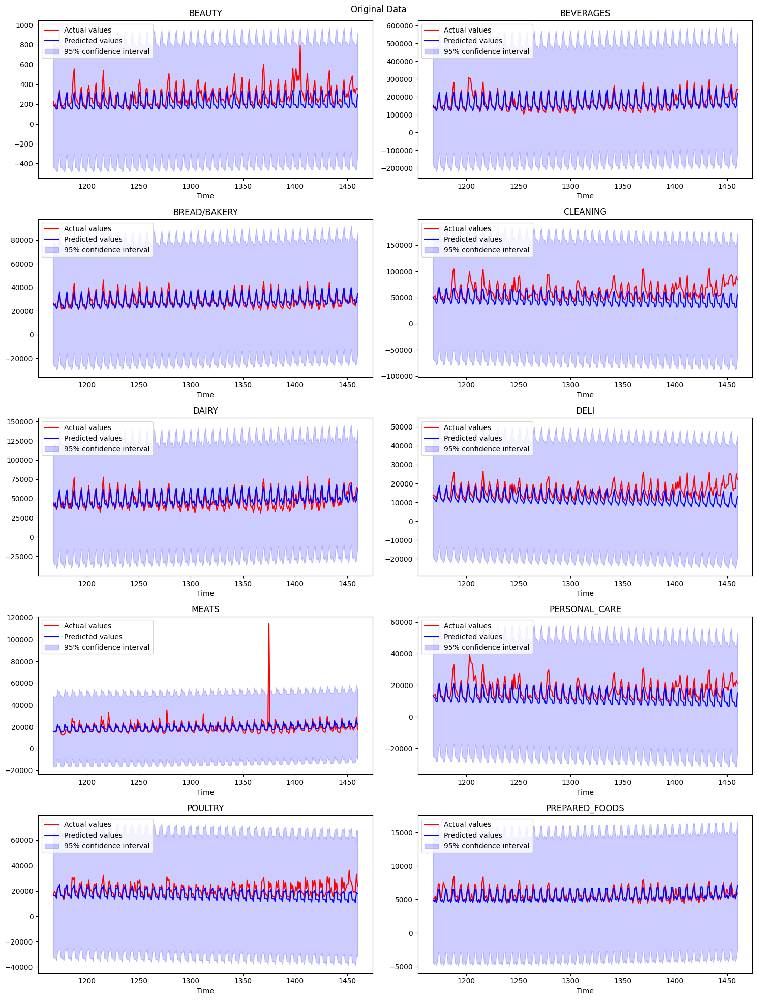

In [60]:
plt.figure(figsize=(15, 20))
for i in range(10):
    plt.subplot(5, 2, i + 1)  
    plt.plot(X_test, test_df.iloc[:, i], 'r-', markersize=10, label='Actual values')
    plt.plot(X_test, pred_Gau.iloc[:, i], 'b-', label='Predicted values')
    plt.fill_between(X_test.flatten(), pred_Gau.iloc[:, i] - 1.96 * sigma_unscale[:, i], pred_Gau.iloc[:, i] + 1.96 * sigma_unscale[:, i], alpha=0.2, color='blue', label='95% confidence interval')
    plt.xlabel('Time')
    plt.title(f'{train_Gaussian.columns[i][6:]}')
    plt.legend(loc='upper left')

plt.suptitle('Original Data')
plt.tight_layout()
plt.show()

## VAR
### Find the optimize hyperparameters

In [61]:
def optimize_VAR(endog: Union[pd.Series, list]) -> pd.DataFrame:
    results = [[2, -27523.789886475883], [3, -28410.49603359954], [4, -29469.19410944266], [5, -30505.789261394668], [6, -31520.52696346849], [7, -31852.696873037465], [8, -31866.17126418741], [9, -31865.88461944672], [10, -31873.78986210983], [11, 805138.0060924445], [12, -31882.34893795087], [13, -31978.215369387115], [14, -31997.592176438186], [15, -31914.78981692301]]
    for i in tqdm_notebook(range(1, 2)):
        try:
            model = VARMAX(endog, order=(i, 0)).fit(dips=False)
        except:
            continue
            
        aic = model.aic
        results.append([i, aic])
        print(results)
        
    result_df = pd.DataFrame(results)
    result_df.columns = ['p', 'AIC']
    
    result_df = result_df.sort_values(by='AIC', ascending=True).reset_index(drop=True)
    
    return result_df

In [62]:
#result_df = optimize_VAR(scaled_train)
#result_df

In [63]:
result_df = optimize_VAR(diff_data)
result_df

  0%|          | 0/1 [00:00<?, ?it/s]

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          165     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.10707D+01    |proj g|=  8.30311D-01


 This problem is unconstrained.



At iterate    5    f= -1.10746D+01    |proj g|=  2.46821D-01

At iterate   10    f= -1.10748D+01    |proj g|=  1.30332D-01

At iterate   15    f= -1.10750D+01    |proj g|=  5.80724D-02

At iterate   20    f= -1.10751D+01    |proj g|=  1.03482D-01

At iterate   25    f= -1.10754D+01    |proj g|=  1.48446D-01

At iterate   30    f= -1.10757D+01    |proj g|=  4.95940D-02

At iterate   35    f= -1.10759D+01    |proj g|=  4.97462D-02

At iterate   40    f= -1.10760D+01    |proj g|=  1.51232D-02

At iterate   45    f= -1.10760D+01    |proj g|=  1.89748D-02

At iterate   50    f= -1.10761D+01    |proj g|=  1.73134D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

,p,AIC
0,14,-31997.592176
1,13,-31978.215369
2,15,-31914.789817
3,12,-31882.348938
4,10,-31873.789862
5,8,-31866.171264
6,9,-31865.884619
7,7,-31852.696873
8,6,-31520.526963
9,5,-30505.789261


### Performing tests

In [64]:
def granger_causality_matrix(data, max_lag):
    variables = data.columns
    df = pd.DataFrame(index=variables, columns=variables)
    for var1 in variables:
        for var2 in variables:
            test_result = grangercausalitytests(data[[var1, var2]], max_lag, verbose=False)
            p_values = [round(test[0]['ssr_ftest'][1], 4) for test in test_result.values()]
            min_p_value = np.min(p_values)
            df.loc[var1, var2] = min_p_value
    df.columns = [var + '_x' for var in variables]
    df.index = [var + '_y' for var in variables]
    return df

In [65]:
result = granger_causality_matrix(diff_data, 14)
result

,sales_BEAUTY_x,sales_BEVERAGES_x,sales_BREAD/BAKERY_x,sales_CLEANING_x,sales_DAIRY_x,sales_DELI_x,sales_MEATS_x,sales_PERSONAL_CARE_x,sales_POULTRY_x,sales_PREPARED_FOODS_x
sales_BEAUTY_y,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
sales_BEVERAGES_y,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
sales_BREAD/BAKERY_y,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
sales_CLEANING_y,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
sales_DAIRY_y,0.0,0.0001,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
sales_DELI_y,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
sales_MEATS_y,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
sales_PERSONAL_CARE_y,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
sales_POULTRY_y,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
sales_PREPARED_FOODS_y,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


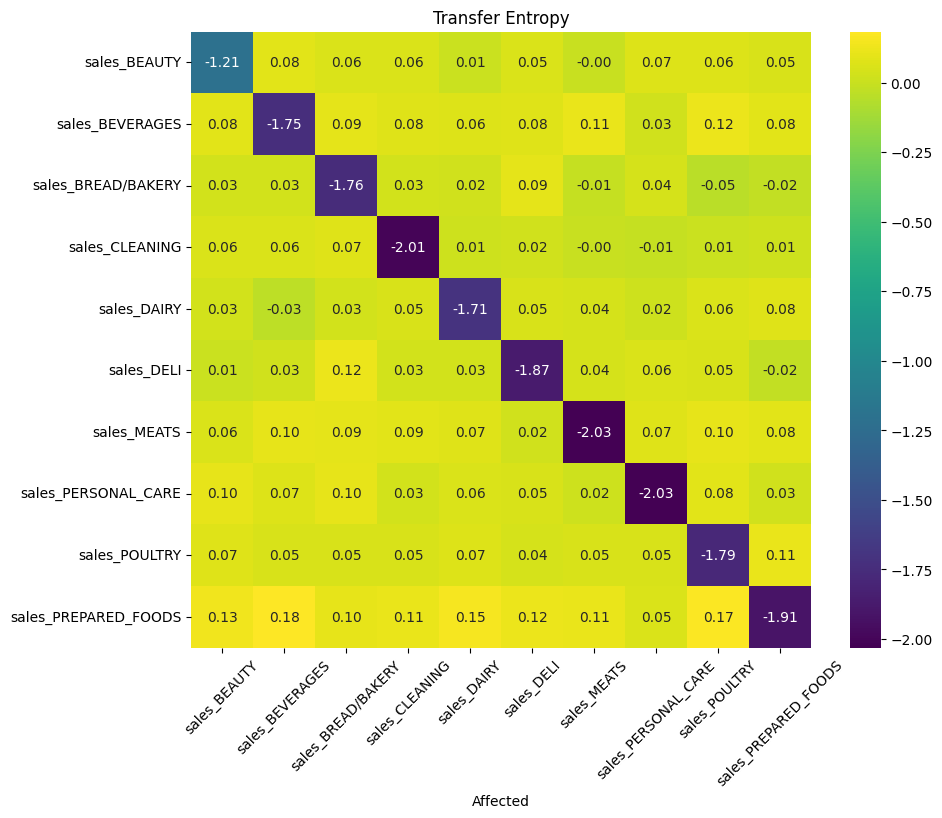

In [66]:
transfer_entropy_matrix = np.zeros((10, 10))

for i in range(10):
    for j in range(10):
        transfer = transent(scaled_train.iloc[:, i], scaled_train.iloc[:, j], lag=14)
        transfer_entropy_matrix[i, j] = transfer

transfer_entropy_df = pd.DataFrame(transfer_entropy_matrix, 
                                   columns=[f'{scaled_train.columns[i]}' for i in range(10)], 
                                   index=[f'{scaled_train.columns[j]}' for j in range(10)])

plt.figure(figsize=(10, 8))
sns.heatmap(transfer_entropy_df, annot=True, cmap='viridis', fmt=".2f")
plt.title('Transfer Entropy')
plt.xlabel('Affected')
plt.xticks(rotation=45)
plt.show()

### Model training

In [67]:
start = time.time()
best_model = VARMAX(diff_data, order=(14,0))
best_model_fit = best_model.fit(disp=False)
end = time.time()
print(best_model_fit.summary())

                                                                                                              Statespace Model Results                                                                                                             
Dep. Variable:     ['sales_BEAUTY', 'sales_BEVERAGES', 'sales_BREAD/BAKERY', 'sales_CLEANING', 'sales_DAIRY', 'sales_DELI', 'sales_MEATS', 'sales_PERSONAL_CARE', 'sales_POULTRY', 'sales_PREPARED_FOODS']   No. Observations:                 1167
Model:                                                                                                                                                                                             VAR(14)   Log Likelihood               17463.796
                                                                                                                                                                                               + intercept   AIC                         -31997.592
Date:                   

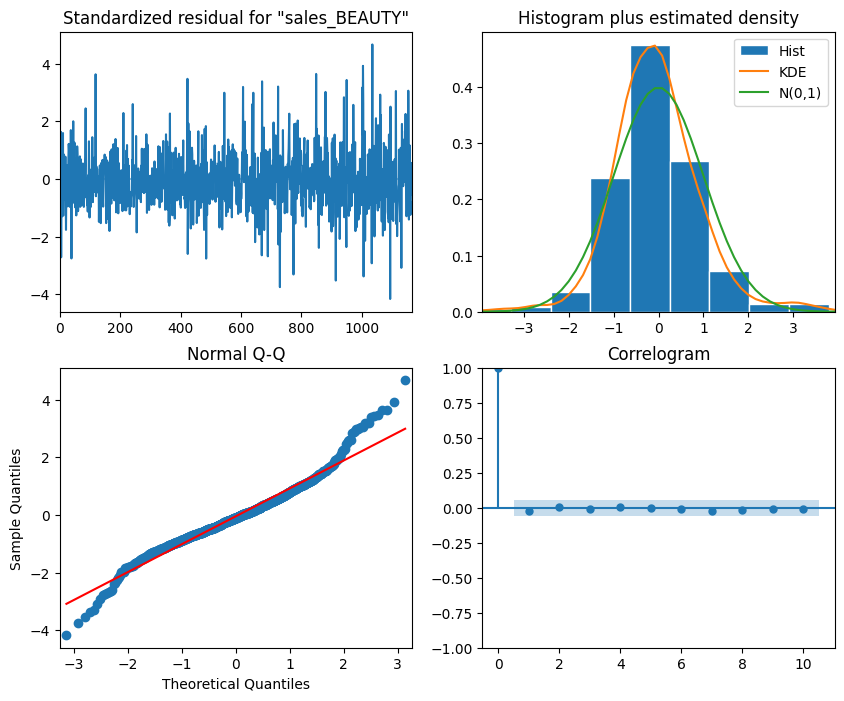

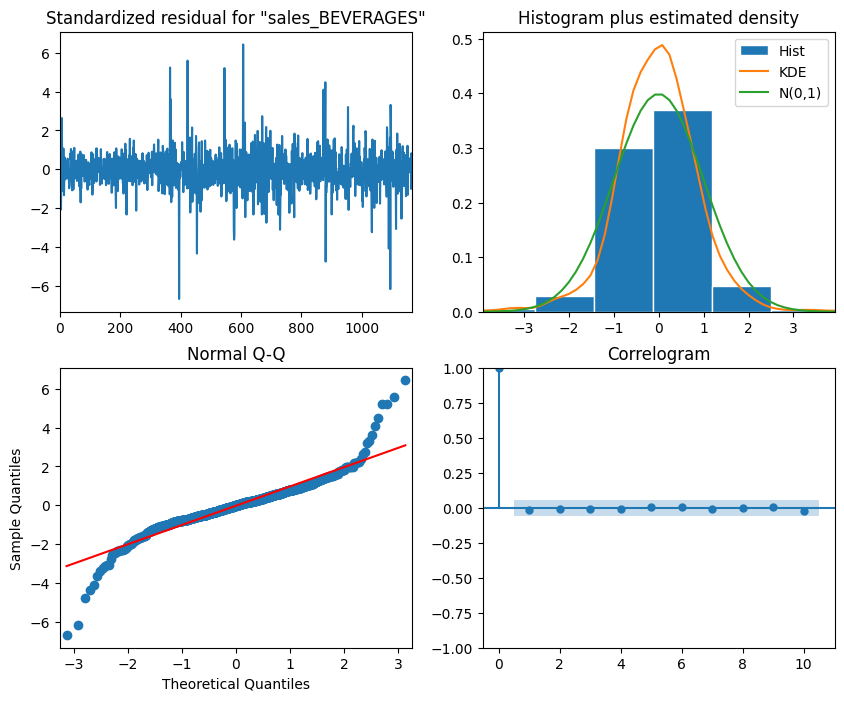

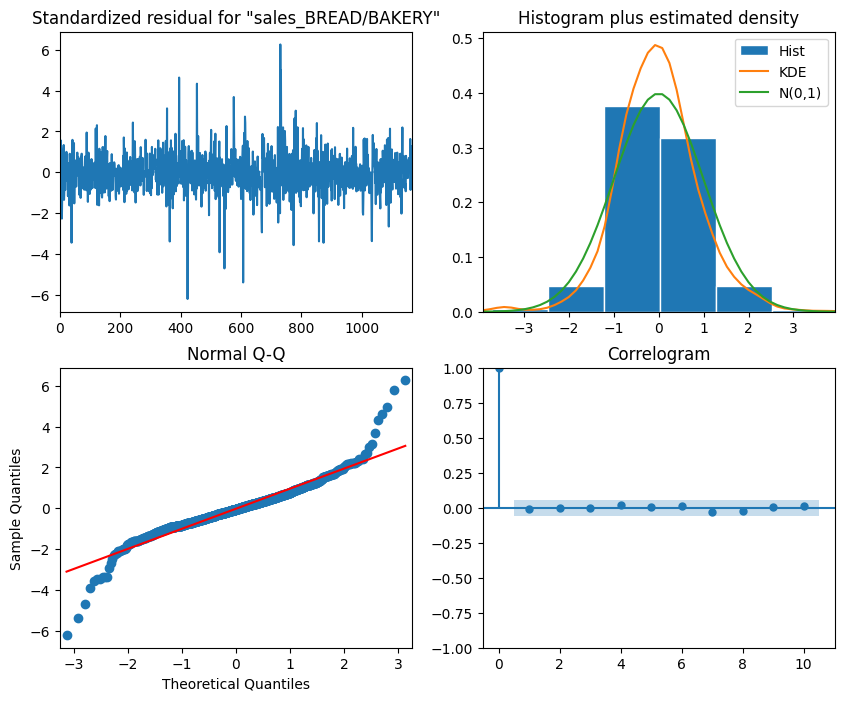

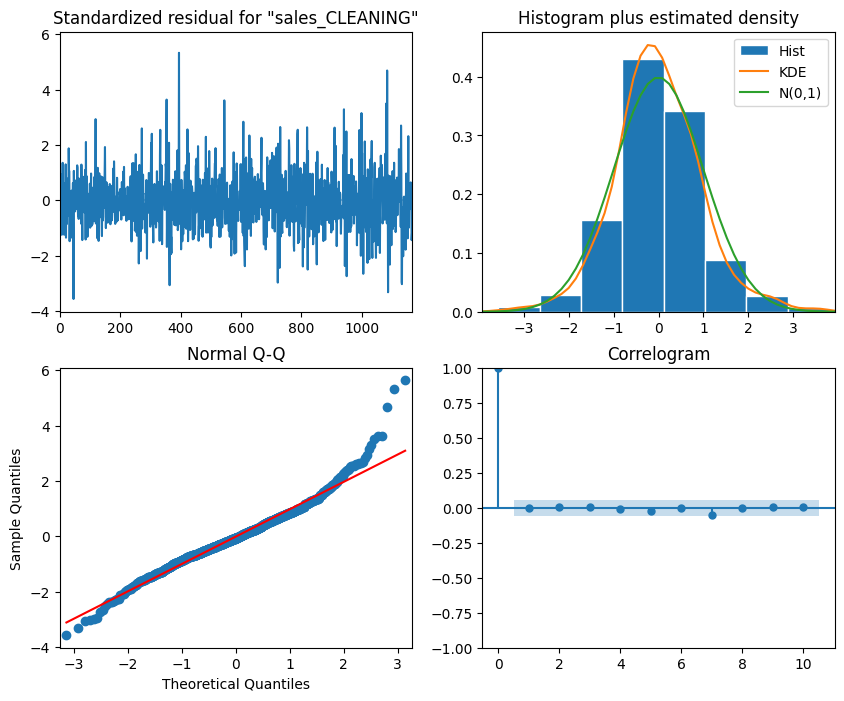

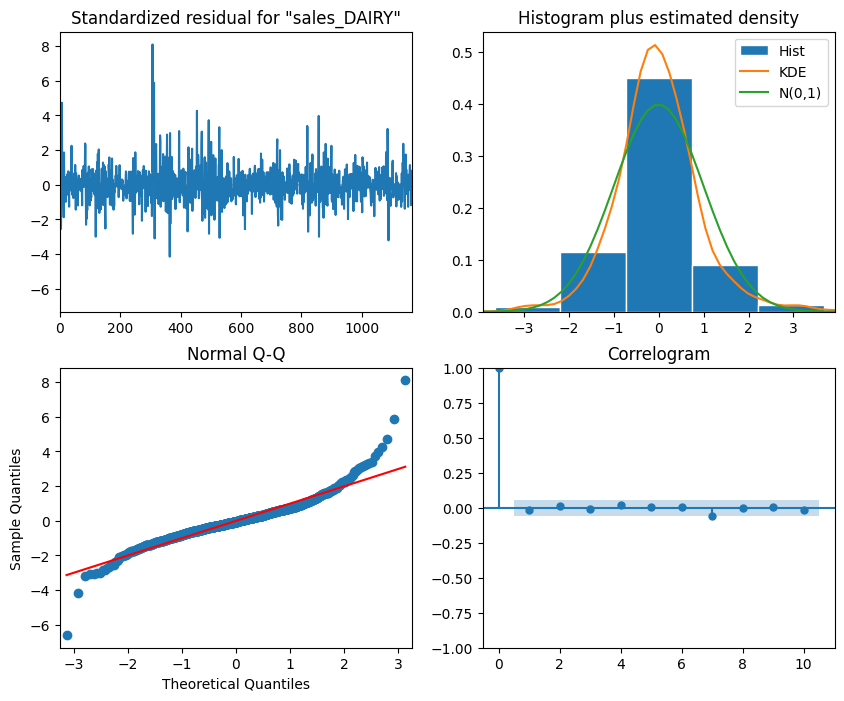

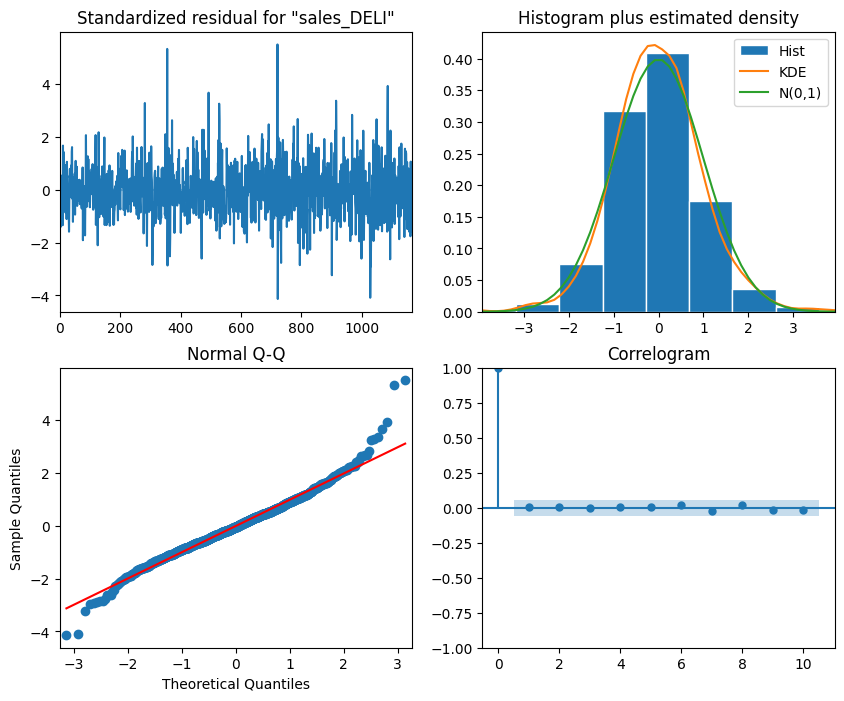

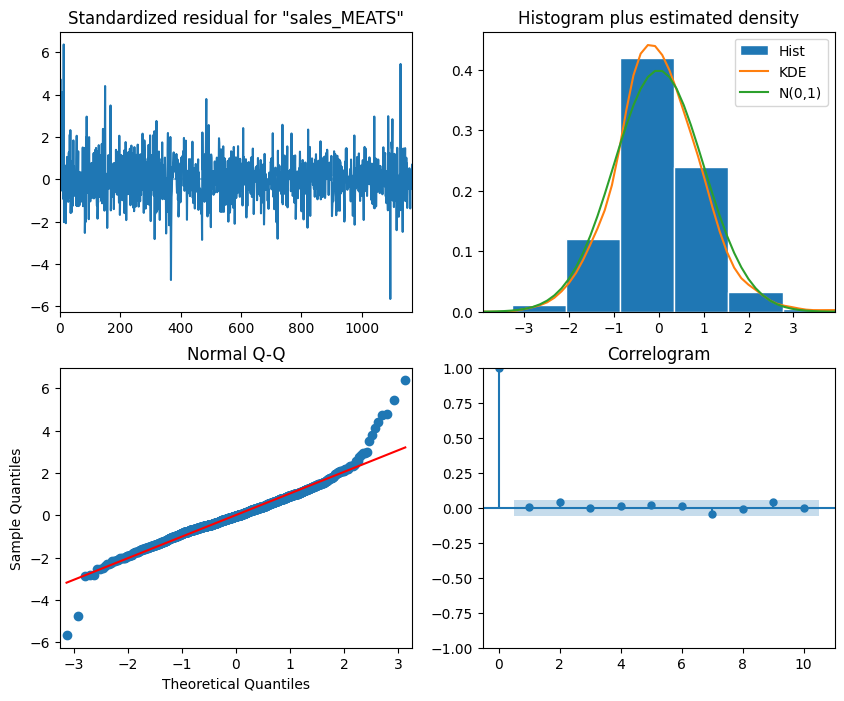

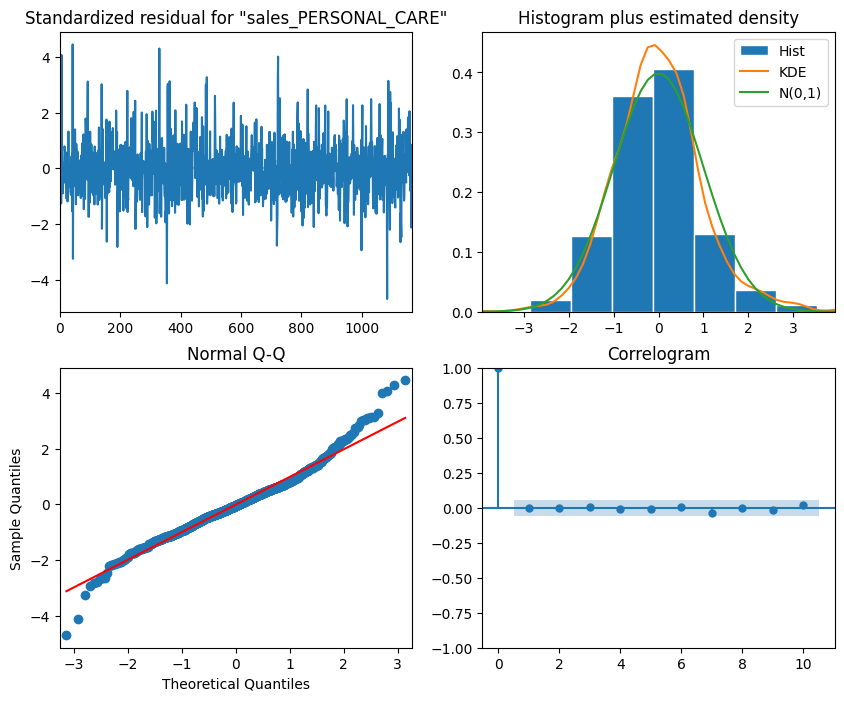

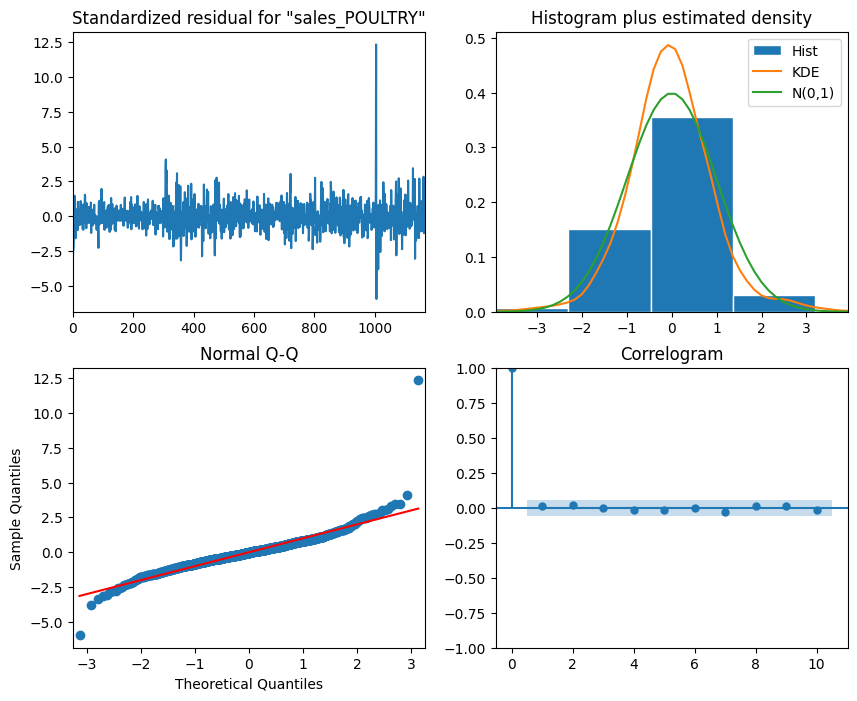

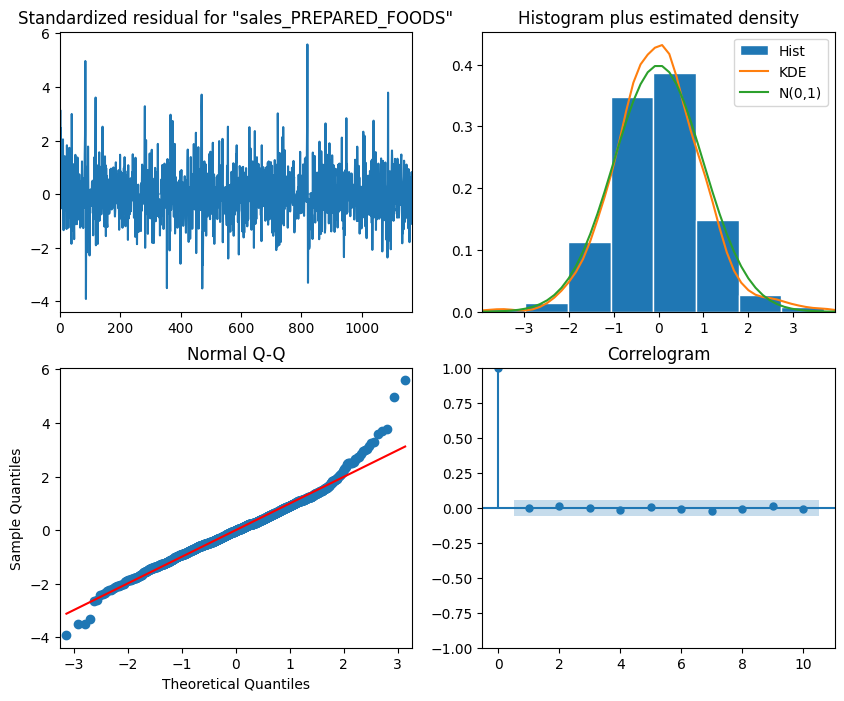

In [68]:
for i in range(10):
    best_model_fit.plot_diagnostics(figsize=(10, 8), variable=i)

plt.show()

In [69]:
print(end-start)

4443.132448673248


In [70]:
TRAIN_LEN = len(scaled_train)
HORIZON = len(scaled_test)
WINDOW = HORIZON

In [71]:
def rolling_forecast(df: pd.DataFrame, train_len: int, horizon: int, window: int) -> pd.DataFrame:
    
    total_len = train_len + horizon
    end_idx = train_len
    
    predictions_dict = {col: [] for col in df.columns}

    for i in range(train_len, total_len, window):
        #model = VARMAX(df[:i], order=(14,0))
        #res = model.fit(disp=False)
        predictions = best_model_fit.get_prediction(0, i + window - 1)

        for col in df.columns:
            oos_pred = predictions.predicted_mean.iloc[-window:][col]
            predictions_dict[col].extend(oos_pred)

    predictions_df = pd.DataFrame(predictions_dict)
    return predictions_df


In [72]:
pred_VAR = rolling_forecast(diff_data, TRAIN_LEN, HORIZON, WINDOW)
pred_VAR.index = pd.RangeIndex(1168,1168 + len(pred_VAR))

In [73]:
last_values = scaled_train.iloc[-1, :]
pred_VAR = pred_VAR.cumsum() + last_values

In [74]:
pred_VAR.head()

,sales_BEAUTY,sales_BEVERAGES,sales_BREAD/BAKERY,sales_CLEANING,sales_DAIRY,sales_DELI,sales_MEATS,sales_PERSONAL_CARE,sales_POULTRY,sales_PREPARED_FOODS
1168,0.141176,0.431511,0.479837,0.309135,0.723420,0.278873,0.375532,0.231018,0.167992,0.568879
1169,0.176422,0.487639,0.573199,0.381415,0.862148,0.287935,0.390569,0.282605,0.174294,0.687331
1170,0.151810,0.343163,0.432955,0.261140,0.649776,0.241571,0.536132,0.199933,0.103991,0.514194
1171,0.108322,0.419487,0.471181,0.299886,0.752056,0.373351,0.964874,0.171825,0.498029,0.640436
1172,0.583100,0.894637,0.813857,0.743923,1.220814,0.651570,0.709281,0.687111,0.531507,1.025499


### Model Evaluation
#### Scaled data


In [75]:
for i in range(10):
    print(f'MSE for {scaled_test.columns[i]}: {mean_squared_error(scaled_test.iloc[:, i], pred_VAR.iloc[:, i])}')
    
print(f'MSE total: {mean_squared_error(scaled_test, pred_VAR)}')

MSE for sales_BEAUTY: 0.29549862294815293
MSE for sales_BEVERAGES: 0.5718722640605813
MSE for sales_BREAD/BAKERY: 0.3752080617435723
MSE for sales_CLEANING: 0.2734389566763421
MSE for sales_DAIRY: 0.7146094370287676
MSE for sales_DELI: 0.3110390981061703
MSE for sales_MEATS: 0.38129147605847413
MSE for sales_PERSONAL_CARE: 0.42159878947427837
MSE for sales_POULTRY: 0.3433167873671143
MSE for sales_PREPARED_FOODS: 0.34125037509845474
MSE total: 0.4029123868561908


In [76]:
for i in range(10):
    print(f'RMSE for {scaled_test.columns[i]}: {mean_squared_error(scaled_test.iloc[:, i], pred_VAR.iloc[:, i], squared=False)}')
    
print(f'RMSE total: {mean_squared_error(scaled_test, pred_VAR, squared=False)}')

RMSE for sales_BEAUTY: 0.5435978503895623
RMSE for sales_BEVERAGES: 0.7562223641632012
RMSE for sales_BREAD/BAKERY: 0.6125422938406558
RMSE for sales_CLEANING: 0.5229139094309331
RMSE for sales_DAIRY: 0.8453457499915449
RMSE for sales_DELI: 0.5577087932838878
RMSE for sales_MEATS: 0.6174880371784333
RMSE for sales_PERSONAL_CARE: 0.6493063910622461
RMSE for sales_POULTRY: 0.5859324085311498
RMSE for sales_PREPARED_FOODS: 0.5841663933319468
RMSE total: 0.6275224191203562


In [77]:
for i in range(10):
    print(f'MAE for {scaled_test.columns[i]}: {mean_absolute_error(scaled_test.iloc[:, i], pred_VAR.iloc[:, i])}')
    
print(f'MAE total: {mean_absolute_error(scaled_test, pred_VAR)}')

MAE for sales_BEAUTY: 0.49189920417299726
MAE for sales_BEVERAGES: 0.7038299248753255
MAE for sales_BREAD/BAKERY: 0.5631970443035721
MAE for sales_CLEANING: 0.46523162404608315
MAE for sales_DAIRY: 0.7830196335763033
MAE for sales_DELI: 0.5141427659812888
MAE for sales_MEATS: 0.46672626870023626
MAE for sales_PERSONAL_CARE: 0.586757051156542
MAE for sales_POULTRY: 0.5473076948116057
MAE for sales_PREPARED_FOODS: 0.5341870719291646
MAE total: 0.565629828355312


In [78]:
for i in range(10):
    print(f'R2 for {scaled_test.columns[i]}: {r2_score(scaled_test.iloc[:, i], pred_VAR.iloc[:, i])}')
    
print(f'R2 total: {r2_score(scaled_test, pred_VAR)}')

R2 for sales_BEAUTY: -1.3299097305701078
R2 for sales_BEVERAGES: -5.342542431354486
R2 for sales_BREAD/BAKERY: -5.240465564264997
R2 for sales_CLEANING: -2.59495124328064
R2 for sales_DAIRY: -6.465078071810211
R2 for sales_DELI: -3.5659121021080837
R2 for sales_MEATS: -0.5904623921366501
R2 for sales_PERSONAL_CARE: -2.9333729908296133
R2 for sales_POULTRY: -6.144895110412965
R2 for sales_PREPARED_FOODS: -6.305256853678931
R2 total: -4.0512846490446695


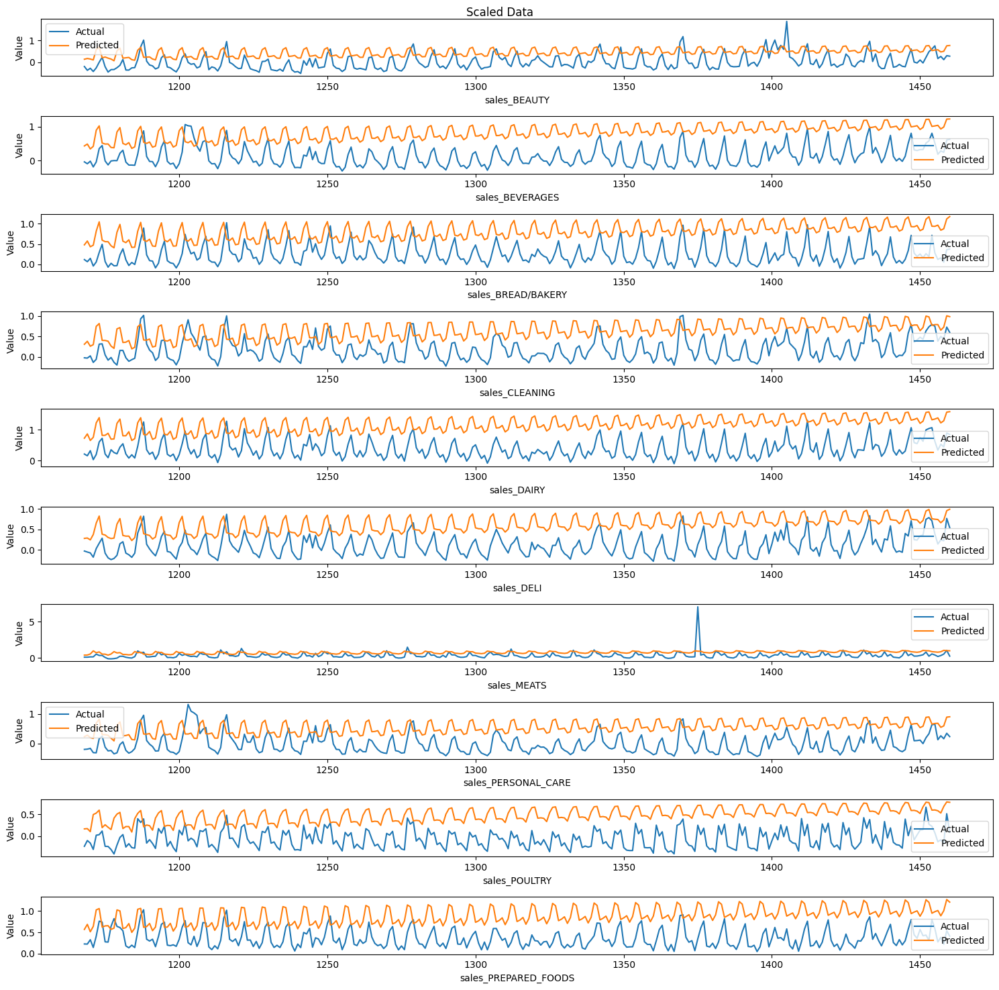

In [79]:
plt.figure(figsize=(15, 15))
for i in range(10):
    plt.subplot(10, 1, i+1)
    plt.plot(scaled_test.iloc[:, i], label='Actual')
    plt.plot(pred_VAR.iloc[:, i], label='Predicted')
    plt.title('')
    plt.xlabel(f'{scaled_test.columns[i]}')
    plt.ylabel('Value')
    plt.legend()
    
plt.suptitle('Scaled Data')
plt.tight_layout()
plt.show()

#### Unscaled data


In [80]:
def inverse(dataset):
    temp = dataset.copy()
    for index, i in enumerate(scaled_test.columns):
        scaler = scalers['scaler_' + i]
        temp.iloc[:, index] = scaler.inverse_transform(np.reshape(dataset.iloc[:, index], (-1, 1))).flatten()
    return temp

In [81]:
inverse_VAR = inverse(pred_VAR)
inverse_VAR.head()

,sales_BEAUTY,sales_BEVERAGES,sales_BREAD/BAKERY,sales_CLEANING,sales_DAIRY,sales_DELI,sales_MEATS,sales_PERSONAL_CARE,sales_POULTRY,sales_PREPARED_FOODS
1168,316.394041,214367.868194,33784.674628,68315.985411,58935.741666,18200.531818,19605.950177,20840.286610,25558.482997,6499.411808
1169,326.104376,222741.247449,35904.751002,72077.620238,63668.312955,18328.996507,19819.073313,21712.564603,25696.154490,6987.398389
1170,319.323562,201187.686506,32720.084361,65818.227085,56423.447584,17671.744055,21882.105171,20314.672860,24160.319250,6274.128417
1171,307.342673,212574.010741,33588.117344,67834.666961,59912.627749,19539.866162,27958.584739,19839.396278,32768.438620,6794.202814
1172,438.144017,283458.521815,41369.598444,90943.265106,75903.840100,23483.928973,24336.121200,28552.357230,33499.784950,8380.544455


In [82]:
for i in range(10):
    print(f'MSE for {scaled_test.columns[i]}: {mean_squared_error(test_df.iloc[:, i], inverse_VAR.iloc[:, i])}')
    
print(f'MSE total: {mean_squared_error(test_df, inverse_VAR)}')

MSE for sales_BEAUTY: 22428.419356420545
MSE for sales_BEVERAGES: 12727427081.650436
MSE for sales_BREAD/BAKERY: 193476707.90297955
MSE for sales_CLEANING: 740573802.5619109
MSE for sales_DAIRY: 831637448.6253461
MSE for sales_DELI: 62507090.87790321
MSE for sales_MEATS: 76589468.93317634
MSE for sales_PERSONAL_CARE: 120541114.76300871
MSE for sales_POULTRY: 163845751.16999722
MSE for sales_PREPARED_FOODS: 5791645.901027736
MSE total: 1492241254.0805142


In [83]:
for i in range(10):
    print(f'MAE for {scaled_test.columns[i]}: {mean_absolute_error(test_df.iloc[:, i], inverse_VAR.iloc[:, i])}')
    
print(f'MAE total: {mean_absolute_error(test_df, inverse_VAR)}')

MAE for sales_BEAUTY: 135.51823074966075
MAE for sales_BEVERAGES: 104999.81159763811
MAE for sales_BREAD/BAKERY: 12789.060178141572
MAE for sales_CLEANING: 24211.584178606252
MAE for sales_DAIRY: 26711.931779822015
MAE for sales_DELI: 7288.545699324068
MAE for sales_MEATS: 6614.822968661423
MAE for sales_PERSONAL_CARE: 9921.474978005966
MAE for sales_POULTRY: 11956.432765896408
MAE for sales_PREPARED_FOODS: 2200.684604702975
MAE total: 20682.986698154848


In [84]:
for i in range(10):
    print(f'RMSE for {scaled_test.columns[i]}: {mean_squared_error(test_df.iloc[:, i], inverse_VAR.iloc[:, i], squared=False)}')
    
print(f'RMSE total: {mean_squared_error(test_df, inverse_VAR, squared=False)}')

RMSE for sales_BEAUTY: 149.76120778232442
RMSE for sales_BEVERAGES: 112815.89906414093
RMSE for sales_BREAD/BAKERY: 13909.59050090906
RMSE for sales_CLEANING: 27213.48567460462
RMSE for sales_DAIRY: 28838.124915211567
RMSE for sales_DELI: 7906.142604197271
RMSE for sales_MEATS: 8751.540946209207
RMSE for sales_PERSONAL_CARE: 10979.12176647152
RMSE for sales_POULTRY: 12800.22465310657
RMSE for sales_PREPARED_FOODS: 2406.583865363461
RMSE total: 22577.047519799653


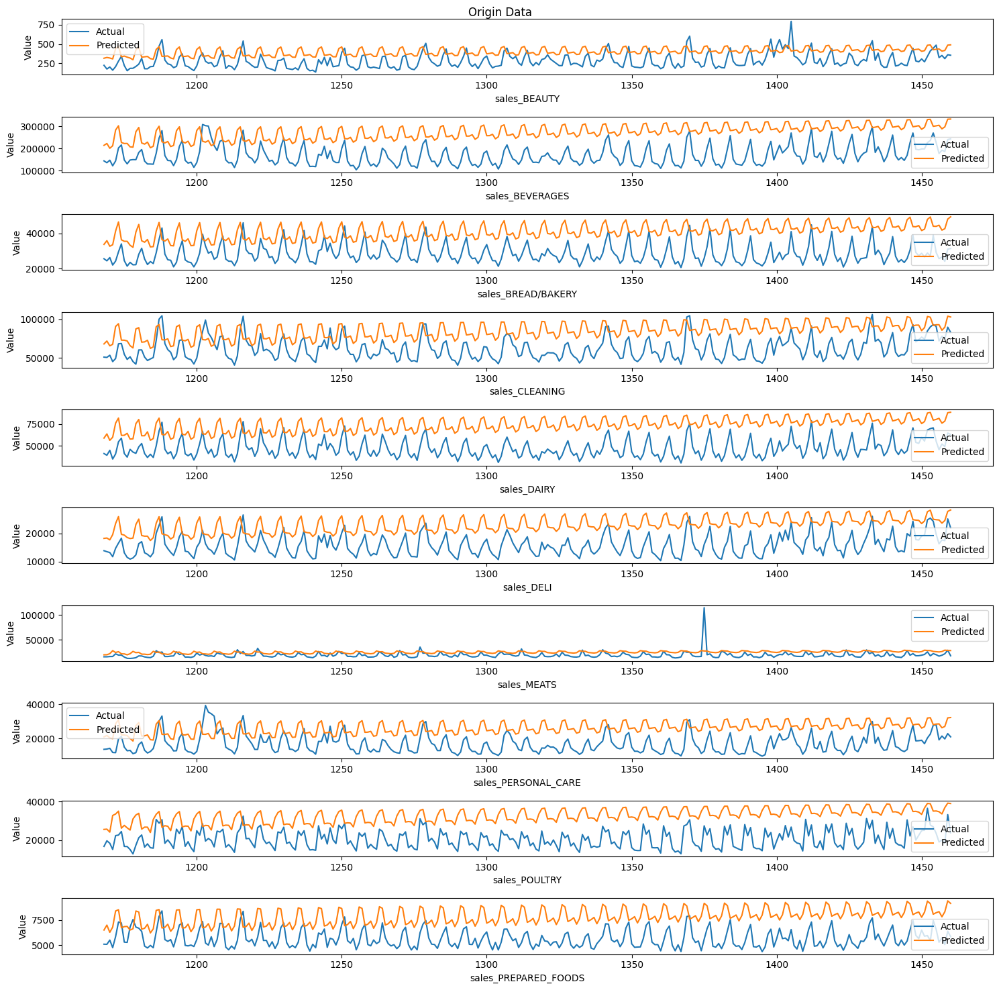

In [85]:
plt.figure(figsize=(15, 15))
for i in range(10):
    plt.subplot(10, 1, i+1)
    plt.plot(test_df.iloc[:, i], label='Actual')
    plt.plot(inverse_VAR.iloc[:, i], label='Predicted')
    plt.title('')
    plt.xlabel(f'{scaled_test.columns[i]}')
    plt.ylabel('Value')
    plt.legend()

plt.suptitle('Origin Data')
plt.tight_layout()
plt.show()

In [ ]:
def split_series(series, n_past, n_future):
    X, y = list(), list()
    for window_start in range(len(series)):
        past_end = window_start + n_past
        future_end = past_end + n_future
        
        if future_end > len(series):
            break
        
        past, future = series[window_start:past_end, :], series[past_end:future_end, :]
        X.append(past)
        y.append(future)
    return np.array(X), np.array(y)

In [ ]:
n_past = 14
n_future = 1
n_features = 10

In [ ]:
trainX, trainY = split_series(scaled_train.values, n_past, n_future)
trainX = trainX.reshape((trainX.shape[0], trainX.shape[1], n_features))
trainY = trainY[:, 0, :].reshape((trainY.shape[0], n_features))

testX, testY = split_series(scaled_test.values, n_past, n_future)
testX = testX.reshape((testX.shape[0], testX.shape[1], n_features))
testY = testY[:, 0, :].reshape((testY.shape[0], n_features))

# CNN
### Find optimal parameters

In [ ]:
def build_cnn_model(filters, kernel_size, n_past, n_features):
    with strategy.scope():
        inputs = layers.Input(shape=(n_past, n_features), name='input_layer') # (batch_size, n_past, n_features)
        
        # Reshape input to (samples, n_past, n_features, 1) to work with Conv2D
        x = layers.Reshape((n_past, n_features, 1), name='reshape_layer')(inputs)
        
        # Lớp 1: Conv2D với kernel_size (7, n_features) và padding='same'
        conv1 = layers.Conv2D(
            filters=filters,  # Số lượng filter
            kernel_size=(kernel_size, n_features),  # Kích thước kernel (7, n_features)
            activation='relu',
            padding='same', 
            name='conv1_layer')(x) # (batch_size, n_past, n_features, filters)
        
        # Batch Normalization sau lớp Conv1
        conv1 = layers.BatchNormalization(name='conv1_bn')(conv1)
        
        # MaxPooling sau lớp Conv1 với pool_size (2, 2)
        pool1 = layers.MaxPooling2D(pool_size=(2, 2), padding='same', name='pool1')(conv1)
        
        # Lớp 2: Conv2D với kernel_size (3, 3) và padding='same'
        conv2 = layers.Conv2D(
            filters=filters,  # Số lượng filter
            kernel_size=(3, 3),  # Kích thước kernel (3, 3)
            activation='relu',
            padding='same', 
            name='conv2_layer')(pool1)
        
        # Batch Normalization sau lớp Conv2
        conv2 = layers.BatchNormalization(name='conv2_bn')(conv2)
        
        # MaxPooling sau lớp Conv2 với pool_size (2, 2)
        pool2 = layers.MaxPooling2D(pool_size=(2, 2), padding='same', name='pool2')(conv2)
        
        # Flatten để đưa đầu ra vào lớp Dense
        flatten = layers.Flatten(name='flatten')(pool2)
        
        # Output layer: dự đoán cho mỗi đặc trưng (n_features)
        outputs = layers.Dense(n_features, name='output')(flatten)
        
        # Tạo và biên dịch mô hình
        model_CNN = tf.keras.models.Model(inputs, outputs)
        model_CNN.compile(optimizer='adam', loss='mse', metrics=['mae'])
    
    return model_CNN

In [ ]:
print('Starting find optimal parameters for CNN model')

# Tập giá trị tham số cần quét
param_grid = {
    'batch_size': [16, 32, 64],
    'filters': [16, 32, 64],
    'kernel_size': [5, 7, 10]
}

# Lưu kết quả
results = []
grid = ParameterGrid(param_grid)

# Lặp qua từng tổ hợp tham số
for params in grid:
    print(f"Testing with parameters: {params}")
    model = build_cnn_model(params['filters'], params['kernel_size'], n_past, n_features)
    
    # Huấn luyện mô hình
    history = model.fit(
        trainX, trainY,
        batch_size=params['batch_size'],
        epochs=5,
        verbose=0,
        validation_split=0.2
    )
    
    # Lưu kết quả
    loss = history.history['loss'][-1]
    val_loss = history.history['val_loss'][-1]
    results.append({
        'batch_size': params['batch_size'],
        'filters': params['filters'],
        'kernel_size': params['kernel_size'],
        'loss': loss,
        'val_loss': val_loss
    })

# Sắp xếp kết quả theo val_loss
results = sorted(results, key=lambda x: x['val_loss'])

# Hiển thị kết quả tốt nhất
print("Best parameters:", results[0])
best_para_CNN = results[0]

Starting find optimal parameters for CNN model
Testing with parameters: {'batch_size': 16, 'filters': 16, 'kernel_size': 3}


I0000 00:00:1732852582.447110     104 service.cc:145] XLA service 0x7815180071e0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1732852582.447166     104 service.cc:153]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0
I0000 00:00:1732852583.808531     104 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


Testing with parameters: {'batch_size': 16, 'filters': 16, 'kernel_size': 5}
Testing with parameters: {'batch_size': 16, 'filters': 16, 'kernel_size': 7}
Testing with parameters: {'batch_size': 16, 'filters': 32, 'kernel_size': 3}
Testing with parameters: {'batch_size': 16, 'filters': 32, 'kernel_size': 5}
Testing with parameters: {'batch_size': 16, 'filters': 32, 'kernel_size': 7}
Testing with parameters: {'batch_size': 16, 'filters': 64, 'kernel_size': 3}
Testing with parameters: {'batch_size': 16, 'filters': 64, 'kernel_size': 5}
Testing with parameters: {'batch_size': 16, 'filters': 64, 'kernel_size': 7}
Testing with parameters: {'batch_size': 32, 'filters': 16, 'kernel_size': 3}
Testing with parameters: {'batch_size': 32, 'filters': 16, 'kernel_size': 5}
Testing with parameters: {'batch_size': 32, 'filters': 16, 'kernel_size': 7}
Testing with parameters: {'batch_size': 32, 'filters': 32, 'kernel_size': 3}
Testing with parameters: {'batch_size': 32, 'filters': 32, 'kernel_size': 5}

### Model initialization

In [ ]:
class CNN:
    def __init__(self, n_past, n_features, best_para_CNN, strategy):
        self.n_past = n_past
        self.n_features = n_features
        self.best_para_CNN = best_para_CNN
        self.strategy = strategy

        # Xây dựng mô hình CNN
        with self.strategy.scope():
            self.model_CNN = self._build_model()

    def _build_model(filters, kernel_size, n_past, n_features):
        with strategy.scope():
            inputs = layers.Input(shape=(n_past, n_features), name='input_layer') # (batch_size, n_past, n_features)
            
            # Reshape input to (samples, n_past, n_features, 1) to work with Conv2D
            x = layers.Reshape((n_past, n_features, 1), name='reshape_layer')(inputs)
            
            # Lớp 1: Conv2D với kernel_size (7, n_features) và padding='same'
            conv1 = layers.Conv2D(
                filters=filters,  # Số lượng filter
                kernel_size=(kernel_size, n_features),  # Kích thước kernel (7, n_features)
                activation='relu',
                padding='same', 
                name='conv1_layer')(x) # (batch_size, n_past, n_features, filters)
            
            # Batch Normalization sau lớp Conv1
            conv1 = layers.BatchNormalization(name='conv1_bn')(conv1)
            
            # MaxPooling sau lớp Conv1 với pool_size (2, 2)
            pool1 = layers.MaxPooling2D(pool_size=(2, 2), padding='same', name='pool1')(conv1)
            
            # Lớp 2: Conv2D với kernel_size (3, 3) và padding='same'
            conv2 = layers.Conv2D(
                filters=filters,  # Số lượng filter
                kernel_size=(3, 3),  # Kích thước kernel (3, 3)
                activation='relu',
                padding='same', 
                name='conv2_layer')(pool1)
            
            # Batch Normalization sau lớp Conv2
            conv2 = layers.BatchNormalization(name='conv2_bn')(conv2)
            
            # MaxPooling sau lớp Conv2 với pool_size (2, 2)
            pool2 = layers.MaxPooling2D(pool_size=(2, 2), padding='same', name='pool2')(conv2)
            
            # Flatten để đưa đầu ra vào lớp Dense
            flatten = layers.Flatten(name='flatten')(pool2)
            
            # Output layer: dự đoán cho mỗi đặc trưng (n_features)
            outputs = layers.Dense(n_features, name='output')(flatten)
            
            # Tạo và biên dịch mô hình
            model_CNN = tf.keras.models.Model(inputs, outputs)
            model_CNN.compile(optimizer='adam', loss='mse', metrics=['mae'])
        
        return model_CNN

    def train(self, trainX, trainY):
        print('Start training CNN')

        reduce_lr = tf.keras.callbacks.LearningRateScheduler(lambda x: 1e-3 * 0.90 ** x)
        early_stop = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

        start = time.time()
        with self.strategy.scope():
            history_CNN = self.model_CNN.fit(
                trainX,
                trainY,
                validation_split=0.2,
                epochs=100,
                batch_size=self.best_para_CNN['batch_size'],
                verbose=0,
                callbacks=[reduce_lr, early_stop]
            )
        end = time.time()
        
        print('Complete training model')
        print(f'Training time: {end - start:.2f} seconds')
        return history_CNN

    def summary(self):
        self.model_CNN.summary()

    def plot_loss(self, history_CNN):
        loss = history_CNN.history['loss']
        val_loss = history_CNN.history['val_loss']
        epochs = range(1, len(loss) + 1)

        plt.figure(figsize=(10, 6))
        plt.plot(epochs, loss, 'bo-', label='Training loss')
        plt.plot(epochs, val_loss, 'ro-', label='Validation loss')
        plt.title('Training and Validation Loss')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.legend()
        plt.show()

    def predict(self, testX):
        # Phương thức dự đoán
        return self.model_CNN.predict(testX)

In [ ]:
model_CNN = CNN(n_past, n_features, best_para_CNN, strategy)
model_CNN.summary()

### Model training

In [ ]:
history_CNN = model_CNN.train(trainX, trainY)
model_CNN.plot_loss(history_CNN)

Start training CNN
Complete training model
Training time: 11.15 seconds


In [ ]:
pred_CNN = model_CNN.predict(testX)

16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


### Model Score
#### Scaled data

In [ ]:
for i in range(n_features):
    print(f'MSE for {scaled_test.columns[i]}: {mean_squared_error(testY[:, i], pred_CNN[:, i])}')
    
print(f'MSE total: {mean_squared_error(testY, pred_CNN)}')

MSE for sales_BEAUTY: 0.19307492391860645
MSE for sales_BEVERAGES: 0.07976277216333491
MSE for sales_BREAD/BAKERY: 0.07401729050905656
MSE for sales_CLEANING: 0.29640636200239523
MSE for sales_DAIRY: 0.24324756043802823
MSE for sales_DELI: 0.2484350118536553
MSE for sales_MEATS: 0.7494586217869186
MSE for sales_PERSONAL_CARE: 0.23628556478898047
MSE for sales_POULTRY: 0.15694469458946853
MSE for sales_PREPARED_FOODS: 0.1056507885369226
MSE total: 0.23832835905873656


In [ ]:
for i in range(n_features):
    print(f'RMSE for {scaled_test.columns[i]}: {mean_squared_error(testY[:, i], pred_CNN[:, i], squared=False)}')
    
print(f'RMSE total: {mean_squared_error(testY, pred_CNN, squared=False)}')

RMSE for sales_BEAUTY: 0.43940291751262467
RMSE for sales_BEVERAGES: 0.28242303759313775
RMSE for sales_BREAD/BAKERY: 0.2720611889062028
RMSE for sales_CLEANING: 0.5444321463712399
RMSE for sales_DAIRY: 0.49320133864176424
RMSE for sales_DELI: 0.4984325549697324
RMSE for sales_MEATS: 0.8657127825017479
RMSE for sales_PERSONAL_CARE: 0.48609213611102625
RMSE for sales_POULTRY: 0.39616245984377235
RMSE for sales_PREPARED_FOODS: 0.32503967225082325
RMSE total: 0.46029602347020715


In [ ]:
for i in range(n_features):
    print(f'MAE for {scaled_test.columns[i]}: {mean_absolute_error(testY[:, i], pred_CNN[:, i])}')
    
print(f'MAE total: {mean_absolute_error(testY, pred_CNN)}')

MAE for sales_BEAUTY: 0.3971282961281556
MAE for sales_BEVERAGES: 0.24107319486763518
MAE for sales_BREAD/BAKERY: 0.2302773283462032
MAE for sales_CLEANING: 0.5012633176080731
MAE for sales_DAIRY: 0.44827235423342626
MAE for sales_DELI: 0.45464405520701245
MAE for sales_MEATS: 0.8614305974552666
MAE for sales_PERSONAL_CARE: 0.4438170823625174
MAE for sales_POULTRY: 0.3417789733230958
MAE for sales_PREPARED_FOODS: 0.28413218684686475
MAE total: 0.42038173863782513


In [ ]:
for i in range(n_features):
    print(f'R2 for {scaled_test.columns[i]}: {r2_score(testY[:, i], pred_CNN[:, i])}')
    
print(f'R2 total: {r2_score(testY, pred_CNN)}')

R2 for sales_BEAUTY: -1.8724234163418787
R2 for sales_BEVERAGES: 0.029790909153607825
R2 for sales_BREAD/BAKERY: -0.14162115011656584
R2 for sales_CLEANING: -3.497202122659722
R2 for sales_DAIRY: -2.5709725573785467
R2 for sales_DELI: -2.550106929628631
R2 for sales_MEATS: -66.16633321250599
R2 for sales_PERSONAL_CARE: -1.983177446085579
R2 for sales_POULTRY: -1.0119237161880306
R2 for sales_PREPARED_FOODS: -1.5758671010164438
R2 total: -8.133983674276775


#### Unscaled data

In [ ]:
unscaled_CNN = unscale(pred_CNN)
originY = unscale(testY)

In [ ]:
for i in range(n_features):
    print(f'MSE for {scaled_test.columns[i]}: {mean_squared_error(originY[:, i], unscaled_CNN[:, i])}')
    
print(f'MSE total: {mean_squared_error(originY, unscaled_CNN)}')

MSE for sales_BEAUTY: 4865560.53030148
MSE for sales_BEVERAGES: 2010051.7681724878
MSE for sales_BREAD/BAKERY: 1865263.432040454
MSE for sales_CLEANING: 7469551.911780217
MSE for sales_DAIRY: 6129929.68029338
MSE for sales_DELI: 6260655.335114325
MSE for sales_MEATS: 18886638.218643777
MSE for sales_PERSONAL_CARE: 5954484.889329426
MSE for sales_POULTRY: 3955065.0301806615
MSE for sales_PREPARED_FOODS: 2662439.3897318235
MSE total: 6005964.018558803


In [ ]:
for i in range(n_features):
    print(f'RMSE for {scaled_test.columns[i]}: {mean_squared_error(originY[:, i], unscaled_CNN[:, i], squared=False)}')
    
print(f'RMSE total: {mean_squared_error(originY, unscaled_CNN, squared=False)}')

RMSE for sales_BEAUTY: 2205.8015618594254
RMSE for sales_BEVERAGES: 1417.7629449849815
RMSE for sales_BREAD/BAKERY: 1365.7464742917896
RMSE for sales_CLEANING: 2733.0480990608667
RMSE for sales_DAIRY: 2475.869479656264
RMSE for sales_DELI: 2502.13015950696
RMSE for sales_MEATS: 4345.876001296376
RMSE for sales_PERSONAL_CARE: 2440.1813230433154
RMSE for sales_POULTRY: 1988.7345298406879
RMSE for sales_PREPARED_FOODS: 1631.6983145581244
RMSE total: 2310.6848888098793


In [ ]:
for i in range(n_features):
    print(f'MAE for {scaled_test.columns[i]}: {mean_absolute_error(originY[:, i], unscaled_CNN[:, i])}')
    
print(f'MAE total: {mean_absolute_error(originY, unscaled_CNN)}')

MAE for sales_BEAUTY: 1993.5830657349675
MAE for sales_BEVERAGES: 1210.1868345612963
MAE for sales_BREAD/BAKERY: 1155.991595450286
MAE for sales_CLEANING: 2516.3406840300872
MAE for sales_DAIRY: 2250.32608636546
MAE for sales_DELI: 2282.3120040591584
MAE for sales_MEATS: 4324.379443601653
MAE for sales_PERSONAL_CARE: 2227.960660953313
MAE for sales_POULTRY: 1715.729564248073
MAE for sales_PREPARED_FOODS: 1426.3428446904259
MAE total: 2110.315278369473


### Plot predict data

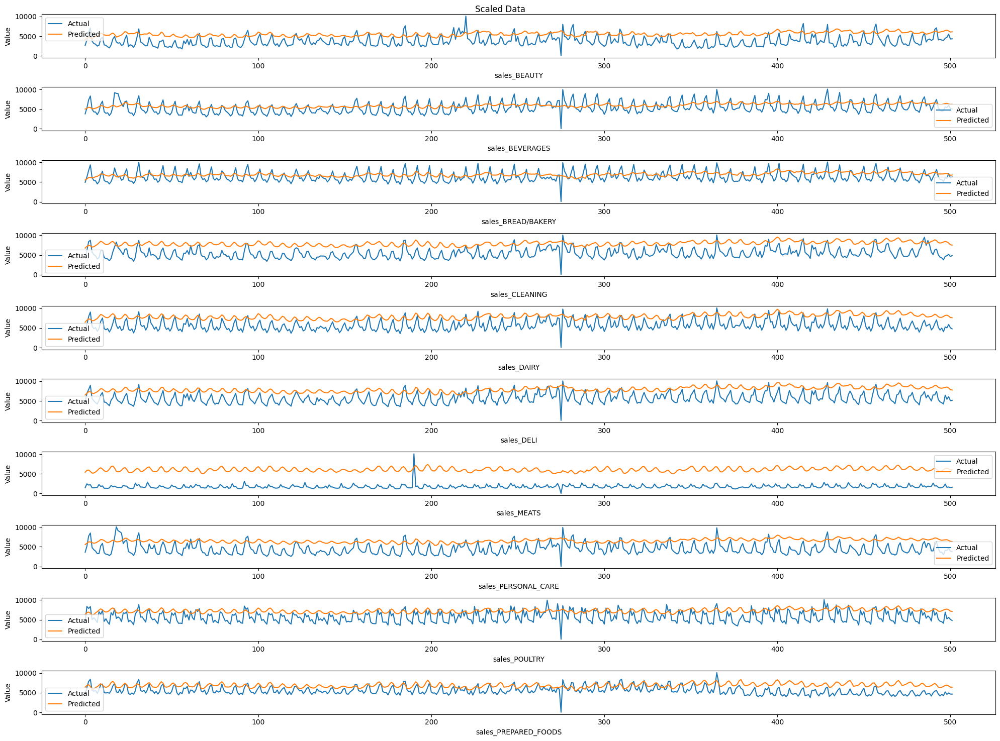

In [ ]:
plt.figure(figsize=(20, 15))
for i in range(n_features):
    plt.subplot(n_features, 1, i+1)
    plt.plot(originY[:, i], label='Actual')
    plt.plot(unscaled_CNN[:, i], label='Predicted')
    plt.title('')
    plt.xlabel(f'{scaled_test.columns[i]}')
    plt.ylabel('Value')
    plt.legend()
    
plt.suptitle('Scaled Data')
plt.tight_layout()
plt.show()

# LSTM
### Find optimal parameters

In [ ]:
def build_lstm_model(n_units, n_past, n_features):
    with strategy.scope():
        inputs = tf.keras.layers.Input(shape=(n_past, n_features), name='input') 
        lstm = tf.keras.layers.LSTM(n_units, return_state=True, name='lstm')
        _, state_h, _ = lstm(inputs)
        
        outputs = tf.keras.layers.Dense(n_features, name='dense')(state_h)
        
        model_LSTM = tf.keras.models.Model(inputs, outputs)
        model_LSTM.compile(optimizer='adam', loss='mse', metrics=['mae'])
        
    return model_LSTM

In [ ]:
print('Starting find optimal parameters for LSTM model')

# Tập giá trị tham số cần quét
param_grid = {
    'batch_size': [16, 32, 64],
    'units': [32, 64, 128]
}

# Lưu tham số và kết quả
results = []
grid = ParameterGrid(param_grid)

# Lặp qua từng tham số
for params in grid:
    print(f"Testing with parameters: {params}")
    model = build_lstm_model(params['units'], n_past, n_features)
    
    # Huấn luyện mô hình
    history = model.fit(
        trainX, trainY,
        batch_size=params['batch_size'],
        epochs=5,
        verbose=0
    )
    
    # Lưu lại kết quả
    loss = history.history['loss'][-1]
    mae = history.history['mae'][-1]
    results.append({
        'batch_size': params['batch_size'],
        'units': params['units'],
        'loss': loss,
        'mae': mae
    })

# Sắp xếp kết quả theo loss
results = sorted(results, key=lambda x: x['loss'])

# Hiển thị kết quả tốt nhất
print("Best parameters:", results[0])
best_para_LSTM = results[0]

### Model initialization

In [ ]:
class LSTM_Model:
    def __init__(self, n_past, n_features, best_para_LSTM, strategy):
        self.n_past = n_past
        self.n_features = n_features
        self.best_para_LSTM = best_para_LSTM
        self.strategy = strategy

        # Xây dựng mô hình LSTM
        with self.strategy.scope():
            self.model_LSTM = self._build_model()

    def _build_model(n_units, n_past, n_features):
        with strategy.scope():
            inputs = tf.keras.layers.Input(shape=(n_past, n_features), name='input') 
            lstm = tf.keras.layers.LSTM(n_units, return_state=True, name='lstm')
            _, state_h, _ = lstm(inputs)
            
            outputs = tf.keras.layers.Dense(n_features, name='dense')(state_h)
            
            model_LSTM = tf.keras.models.Model(inputs, outputs)
            model_LSTM.compile(optimizer='adam', loss='mse', metrics=['mae'])
            
        return model_LSTM

    def train(self, trainX, trainY):
        print('Start training LSTM')

        reduce_lr = tf.keras.callbacks.LearningRateScheduler(lambda x: 1e-3 * 0.90 ** x)
        early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
        start = time.time()
        with self.strategy.scope():
            history_LSTM = self.model_LSTM.fit(
                trainX,
                trainY,
                epochs=50,
                validation_split=0.2,
                batch_size=self.best_para_LSTM['batch_size'],
                verbose=0,
                callbacks=[reduce_lr, early_stopping]
            )
        end = time.time()
        print('Complete training model')
        print(f'Training time: {end - start:.2f} seconds')
        return history_LSTM

    def summary(self):
        self.model_LSTM.summary()

    def plot_loss(self, history_LSTM):
        loss = history_LSTM.history['loss']
        val_loss = history_LSTM.history['val_loss']
        epochs = range(1, len(loss) + 1)

        plt.figure(figsize=(10, 6))
        plt.plot(epochs, loss, 'bo-', label='Training loss')
        plt.plot(epochs, val_loss, 'ro-', label='Validation loss')
        plt.title('Training and Validation Loss')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.legend()
        plt.show()

    def predict(self, testX):
        # Phương thức dự đoán
        return self.model_LSTM.predict(testX)

In [ ]:
lstm_model = LSTM_Model(n_past=n_past, n_features=n_features, best_para_LSTM=best_para_LSTM, strategy=strategy)
lstm_model.summary()

Model: "functional_75"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_37 (InputLayer)     │ (None, 14, 10)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_9 (LSTM)                   │ [(None, 128), (None,   │        71,168 │
│                                 │ 128), (None, 128)]     │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_37 (Dense)                │ (None, 10)             │         1,290 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 72,458 (283.04 KB)

 Trainable params: 72,458 (283.04 KB)

 Non-trainable params: 0 (0.00 B)

### Model training

In [ ]:
history_LSTM = lstm_model.train(trainX, trainY)
lstm_model.plot_loss(history_LSTM)

Start training LSTM
Complete training model
Training time: 15.08 seconds


In [ ]:
pred_LSTM = lstm_model.predict(testX)

16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step


### Model Score
#### Scaled data

In [ ]:
for i in range(n_features):
    print(f'MSE for {scaled_test.columns[i]}: {mean_squared_error(testY[:, i], pred_LSTM[:, i])}')
    
print(f'MSE total: {mean_squared_error(testY, pred_LSTM)}')

MSE for sales_BEAUTY: 0.036535879292451036
MSE for sales_BEVERAGES: 0.07717884108201234
MSE for sales_BREAD/BAKERY: 0.04074307448205564
MSE for sales_CLEANING: 0.1411288145648677
MSE for sales_DAIRY: 0.05914419527333358
MSE for sales_DELI: 0.09923497346284436
MSE for sales_MEATS: 0.585577407824658
MSE for sales_PERSONAL_CARE: 0.23640880011499368
MSE for sales_POULTRY: 0.056156477063420376
MSE for sales_PREPARED_FOODS: 0.024892455896671193
MSE total: 0.1357000919057308


In [ ]:
for i in range(n_features):
    print(f'RMSE for {scaled_test.columns[i]}: {mean_squared_error(testY[:, i], pred_LSTM[:, i], squared=False)}')
    
print(f'RMSE total: {mean_squared_error(testY, pred_LSTM, squared=False)}')

RMSE for sales_BEAUTY: 0.19114360908084538
RMSE for sales_BEVERAGES: 0.27781080087356635
RMSE for sales_BREAD/BAKERY: 0.20184913792745224
RMSE for sales_CLEANING: 0.3756711521595286
RMSE for sales_DAIRY: 0.24319579616706696
RMSE for sales_DELI: 0.3150158304956187
RMSE for sales_MEATS: 0.7652302972469517
RMSE for sales_PERSONAL_CARE: 0.4862188808705331
RMSE for sales_POULTRY: 0.23697357882983575
RMSE for sales_PREPARED_FOODS: 0.15777343216356546
RMSE total: 0.32508825158149646


In [ ]:
for i in range(n_features):
    print(f'MAE for {scaled_test.columns[i]}: {mean_absolute_error(testY[:, i], pred_LSTM[:, i])}')
    
print(f'MAE total: {mean_absolute_error(testY, pred_LSTM)}')

MAE for sales_BEAUTY: 0.13541095504701448
MAE for sales_BEVERAGES: 0.2043586609530685
MAE for sales_BREAD/BAKERY: 0.14945171657419573
MAE for sales_CLEANING: 0.3413749797401278
MAE for sales_DAIRY: 0.19959378685966545
MAE for sales_DELI: 0.263137606748948
MAE for sales_MEATS: 0.7576957206153402
MAE for sales_PERSONAL_CARE: 0.4542661270317658
MAE for sales_POULTRY: 0.19245566803622968
MAE for sales_PREPARED_FOODS: 0.11587368938573814
MAE total: 0.2813618910992094


In [ ]:
for i in range(n_features):
    print(f'R2 for {scaled_test.columns[i]}: {r2_score(testY[:, i], pred_LSTM[:, i])}')
    
print(f'R2 total: {r2_score(testY, pred_LSTM)}')

R2 for sales_BEAUTY: 0.4564466835656067
R2 for sales_BEVERAGES: 0.06122102820822228
R2 for sales_BREAD/BAKERY: 0.37159067523826683
R2 for sales_CLEANING: -1.1412657951803493
R2 for sales_DAIRY: 0.1317392952719053
R2 for sales_DELI: -0.41805603132734803
R2 for sales_MEATS: -51.47933128301359
R2 for sales_PERSONAL_CARE: -1.9847333297276966
R2 for sales_POULTRY: 0.28011234583621214
R2 for sales_PREPARED_FOODS: 0.39309815765994294
R2 total: -5.332917825346886


#### Unscaled data

In [ ]:
unscaled_LSTM = unscale(pred_LSTM)
originY = unscale(testY)

In [ ]:
for i in range(n_features):
    print(f'MSE for {scaled_test.columns[i]}: {mean_squared_error(originY[:, i], unscaled_LSTM[:, i])}')
    
print(f'MSE total: {mean_squared_error(originY, unscaled_LSTM)}')

MSE for sales_BEAUTY: 920717.8778403198
MSE for sales_BEVERAGES: 1944935.756331416
MSE for sales_BREAD/BAKERY: 1026740.7329602903
MSE for sales_CLEANING: 3556499.001936525
MSE for sales_DAIRY: 1490455.7992933788
MSE for sales_DELI: 2500758.5561671453
MSE for sales_MEATS: 14756770.25000299
MSE for sales_PERSONAL_CARE: 5957590.492911558
MSE for sales_POULTRY: 1415164.2525375555
MSE for sales_PREPARED_FOODS: 627299.246062847
MSE total: 3419693.1966044023


In [ ]:
for i in range(n_features):
    print(f'RMSE for {scaled_test.columns[i]}: {mean_squared_error(originY[:, i], unscaled_LSTM[:, i], squared=False)}')
    
print(f'RMSE total: {mean_squared_error(originY, unscaled_LSTM, squared=False)}')

RMSE for sales_BEAUTY: 959.5404513830148
RMSE for sales_BEVERAGES: 1394.6095354368606
RMSE for sales_BREAD/BAKERY: 1013.2821586114552
RMSE for sales_CLEANING: 1885.868235571225
RMSE for sales_DAIRY: 1220.8422499624508
RMSE for sales_DELI: 1581.3786884131027
RMSE for sales_MEATS: 3841.4541842905
RMSE for sales_PERSONAL_CARE: 2440.8175869801407
RMSE for sales_POULTRY: 1189.6067638247337
RMSE for sales_PREPARED_FOODS: 792.0222509897351
RMSE total: 1631.9422105463223


In [ ]:
for i in range(n_features):
    print(f'MAE for {scaled_test.columns[i]}: {mean_absolute_error(originY[:, i], unscaled_LSTM[:, i])}')
    
print(f'MAE total: {mean_absolute_error(originY, unscaled_LSTM)}')

MAE for sales_BEAUTY: 679.7626591212519
MAE for sales_BEVERAGES: 1025.8799842828791
MAE for sales_BREAD/BAKERY: 750.247231469753
MAE for sales_CLEANING: 1713.7015378749388
MAE for sales_DAIRY: 1001.9602807987476
MAE for sales_DELI: 1320.950122621988
MAE for sales_MEATS: 3803.630626370577
MAE for sales_PERSONAL_CARE: 2280.414847569793
MAE for sales_POULTRY: 966.1269719229836
MAE for sales_PREPARED_FOODS: 581.6856380897037
MAE total: 1412.4359900122613


In [ ]:
plt.figure(figsize=(20, 15))
for i in range(n_features):
    plt.subplot(n_features, 1, i+1)
    plt.plot(originY[:, i], label='Actual')
    plt.plot(unscaled_LSTM[:, i], label='Predicted')
    plt.title('')
    plt.xlabel(f'{scaled_test.columns[i]}')
    plt.ylabel('Value')
    plt.legend()
    
plt.suptitle('Scaled Data')
plt.tight_layout()
plt.show()

# CNN + LSTM
### Find optimal parameters

In [ ]:
def build_cnn_lstm_model(filters, kernel_size, lstm_units, n_past, n_features):
    with strategy.scope():
        inputs = layers.Input(shape=(n_past, n_features), name='input_layer')
        x = layers.Reshape((n_past, n_features, 1), name='reshape_layer')(inputs)
    
        conv1 = layers.Conv2D(
            filters=filters,
            kernel_size=(kernel_size, n_features),
            activation='relu',
            padding='same',
            name='conv1')(x)
        conv1_bn = layers.BatchNormalization(name='conv1_bn')(conv1)
        pool1 = layers.MaxPooling2D(pool_size=(2, 2), padding='same', name='pool1')(conv1_bn)
    
        conv2 = layers.Conv2D(
            filters=filters,
            kernel_size=(3, 3),
            activation='relu',
            padding='same',
            name='conv2')(pool1)
        conv2_bn = layers.BatchNormalization(name='conv2_bn')(conv2)
        pool2 = layers.MaxPooling2D(pool_size=(2, 2), padding='same', name='pool2')(conv2_bn)
    
        flatten = layers.Flatten(name='flatten')(pool2)
    
        lstm_input = layers.Reshape((1, flatten.shape[-1]), name='lstm_input')(flatten)
    
        lstm = layers.LSTM(lstm_units, return_state=True, name='lstm')
        _, state_h, _ = lstm(lstm_input)
        
        outputs = layers.Dense(n_features, name='outputs')(state_h)
        
        model_CNN_LSTM = tf.keras.models.Model(inputs, outputs)
        model_CNN_LSTM.compile(optimizer='adam', loss='mse', metrics=['mae'])
        
    return model_CNN_LSTM

In [ ]:
print('Starting find optimal parameters for CNN + LSTM model')
# Tập giá trị tham số cần quét
param_grid = {
    'filters': [16, 32, 64],
    'kernel_size': [5, 7, 10],
    'lstm_units': [32, 64, 128],
    'batch_size': [16, 32, 64]
}

# Lưu kết quả
results = []
grid = ParameterGrid(param_grid)

# Lặp qua từng tổ hợp tham số
for params in grid:
    print(f"Testing with parameters: {params}")
    cnn_lstm_model = build_cnn_lstm_model(params['filters'], params['kernel_size'], 
                                 params['lstm_units'], n_past, n_features)
    with strategy.scope():
        # Huấn luyện mô hình
        history = cnn_lstm_model.fit(
            trainX, trainY,
            batch_size=params['batch_size'],
            epochs=5,
            verbose=0,
            validation_split=0.2
        )
    
    # Lưu kết quả
    loss = history.history['loss'][-1]
    val_loss = history.history['val_loss'][-1]
    results.append({
        'filters': params['filters'],
        'kernel_size': params['kernel_size'],
        'lstm_units': params['lstm_units'],
        'batch_size': params['batch_size'],
        'loss': loss,
        'val_loss': val_loss
    })

# Sắp xếp kết quả theo val_loss
results = sorted(results, key=lambda x: x['val_loss'])

# Hiển thị kết quả tốt nhất
print("Best parameters:", results[0])
best_para_cnn_lstm = results[0]

### Model initialization

In [ ]:
class CNN_LSTM_Model:
    def __init__(self, n_past, n_features, best_para_cnn_lstm, strategy):
        self.n_past = n_past
        self.n_features = n_features
        self.best_para_cnn_lstm = best_para_cnn_lstm
        self.strategy = strategy

        # Xây dựng mô hình CNN + LSTM
        with self.strategy.scope():
            self.model_CNN_LSTM = self._build_model()

    def _build_model(filters, kernel_size, lstm_units, n_past, n_features):
        with strategy.scope():
            inputs = layers.Input(shape=(n_past, n_features), name='input_layer')
            x = layers.Reshape((n_past, n_features, 1), name='reshape_layer')(inputs)
        
            conv1 = layers.Conv2D(
                filters=filters,
                kernel_size=(kernel_size, n_features),
                activation='relu',
                padding='same',
                name='conv1')(x)
            conv1_bn = layers.BatchNormalization(name='conv1_bn')(conv1)
            pool1 = layers.MaxPooling2D(pool_size=(2, 2), padding='same', name='pool1')(conv1_bn)
        
            conv2 = layers.Conv2D(
                filters=filters,
                kernel_size=(3, 3),
                activation='relu',
                padding='same',
                name='conv2')(pool1)
            conv2_bn = layers.BatchNormalization(name='conv2_bn')(conv2)
            pool2 = layers.MaxPooling2D(pool_size=(2, 2), padding='same', name='pool2')(conv2_bn)
        
            flatten = layers.Flatten(name='flatten')(pool2)
        
            lstm_input = layers.Reshape((1, flatten.shape[-1]), name='lstm_input')(flatten)
        
            lstm = layers.LSTM(lstm_units, return_state=True, name='lstm')
            _, state_h, _ = lstm(lstm_input)
            
            outputs = layers.Dense(n_features, name='outputs')(state_h)
            
            model_CNN_LSTM = tf.keras.models.Model(inputs, outputs)
            model_CNN_LSTM.compile(optimizer='adam', loss='mse', metrics=['mae'])
            
        return model_CNN_LSTM

    def train(self, trainX, trainY):
        print('Start training CNN + LSTM')

        reduce_lr = tf.keras.callbacks.LearningRateScheduler(lambda x: 1e-3 * 0.90 ** x)
        early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

        start = time.time()
        with self.strategy.scope():        
            history_CNN_LSTM = self.model_CNN_LSTM.fit(
                trainX,
                trainY,
                epochs=100,
                validation_split=0.2,
                batch_size=self.best_para_cnn_lstm['batch_size'],
                verbose=0,
                callbacks=[reduce_lr, early_stopping]
            )
        end = time.time()
        print('Complete training model')
        print(f'Training time: {end - start:.2f} seconds')
        return history_CNN_LSTM

    def summary(self):
        self.model_CNN_LSTM.summary()

    def plot_loss(self, history_CNN_LSTM):
        loss = history_CNN_LSTM.history['loss']
        val_loss = history_CNN_LSTM.history['val_loss']
        epochs = range(1, len(loss) + 1)

        plt.figure(figsize=(10, 6))
        plt.plot(epochs, loss, 'bo-', label='Training loss')
        plt.plot(epochs, val_loss, 'ro-', label='Validation loss')
        plt.title('Training and Validation Loss')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.legend()
        plt.show()

    def predict(self, testX):
        # Phương thức dự đoán
        return self.model_CNN_LSTM.predict(testX)

In [ ]:
cnn_lstm_model = CNN_LSTM_Model(n_past=n_past, n_features=n_features, best_para_cnn_lstm=best_para_cnn_lstm, strategy=strategy)
cnn_lstm_model.summary()

Model: "functional_185"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_92 (InputLayer)     │ (None, 14, 10)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_82 (Conv1D)              │ (None, 14, 32)         │           992 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_64 (LSTM)                  │ [(None, 128), (None,   │        82,432 │
│                                 │ 128), (None, 128)]     │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_92 (Dense)                │ (None, 10)             │         1,290 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 84,714 (330.91 KB)

 Trainable params: 84,714 (330.91 KB)

 Non-trainable params: 0 (0.00 B)

### Model training

In [ ]:
history_CNN_LSTM = cnn_lstm_model.train(trainX, trainY)
cnn_lstm_model.plot_loss(history_CNN_LSTM)

Start training CNN + LSTM
Complete training model
Training time: 10.81 seconds


In [ ]:
pred_CNN_LSTM = cnn_lstm_model.predict(testX)

16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


### Model Score
#### Scaled data

In [ ]:
for i in range(n_features):
    print(f'MSE for {scaled_test.columns[i]}: {mean_squared_error(testY[:, i], pred_CNN_LSTM[:, i])}')
    
print(f'MSE total: {mean_squared_error(testY, pred_CNN_LSTM)}')

MSE for sales_BEAUTY: 0.04303860811060909
MSE for sales_BEVERAGES: 0.05468722968427897
MSE for sales_BREAD/BAKERY: 0.04101786834237441
MSE for sales_CLEANING: 0.15165374974878565
MSE for sales_DAIRY: 0.07637374569447879
MSE for sales_DELI: 0.05961802739612465
MSE for sales_MEATS: 0.4577425670342848
MSE for sales_PERSONAL_CARE: 0.21208776273182917
MSE for sales_POULTRY: 0.06991643674191858
MSE for sales_PREPARED_FOODS: 0.048005398412844486
MSE total: 0.12141413938975287


In [ ]:
for i in range(n_features):
    print(f'RMSE for {scaled_test.columns[i]}: {mean_squared_error(testY[:, i], pred_CNN_LSTM[:, i], squared=False)}')
    
print(f'RMSE total: {mean_squared_error(testY, pred_CNN_LSTM, squared=False)}')

RMSE for sales_BEAUTY: 0.20745748506768583
RMSE for sales_BEVERAGES: 0.23385300871333464
RMSE for sales_BREAD/BAKERY: 0.20252868523341183
RMSE for sales_CLEANING: 0.3894274640402056
RMSE for sales_DAIRY: 0.2763580027690148
RMSE for sales_DELI: 0.2441680310690256
RMSE for sales_MEATS: 0.6765667498734215
RMSE for sales_PERSONAL_CARE: 0.4605298717041373
RMSE for sales_POULTRY: 0.26441716423469674
RMSE for sales_PREPARED_FOODS: 0.2191013427910575
RMSE total: 0.3174407805495992


In [ ]:
for i in range(n_features):
    print(f'MAE for {scaled_test.columns[i]}: {mean_absolute_error(testY[:, i], pred_CNN_LSTM[:, i])}')
    
print(f'MAE total: {mean_absolute_error(testY, pred_CNN_LSTM)}')

MAE for sales_BEAUTY: 0.15065301003352685
MAE for sales_BEVERAGES: 0.17666428851372443
MAE for sales_BREAD/BAKERY: 0.1471635010530331
MAE for sales_CLEANING: 0.35103263781389227
MAE for sales_DAIRY: 0.23936534240832236
MAE for sales_DELI: 0.2038780368442515
MAE for sales_MEATS: 0.6714020369849667
MAE for sales_PERSONAL_CARE: 0.4232852136680794
MAE for sales_POULTRY: 0.22290891550212152
MAE for sales_PREPARED_FOODS: 0.18528554765117544
MAE total: 0.2771638530473093


In [ ]:
for i in range(n_features):
    print(f'R2 for {scaled_test.columns[i]}: {r2_score(testY[:, i], pred_CNN_LSTM[:, i])}')
    
print(f'R2 total: {r2_score(testY, pred_CNN_LSTM)}')

R2 for sales_BEAUTY: 0.3597039779448986
R2 for sales_BEVERAGES: 0.33480186365335884
R2 for sales_BREAD/BAKERY: 0.36735233470047457
R2 for sales_CLEANING: -1.300954543189035
R2 for sales_DAIRY: -0.12119747259983016
R2 for sales_DELI: 0.14806544129759047
R2 for sales_MEATS: -40.02279817619314
R2 for sales_PERSONAL_CARE: -1.6776728021340772
R2 for sales_POULTRY: 0.10371906740538306
R2 for sales_PREPARED_FOODS: -0.17041744936544667
R2 total: -4.197939775847982


#### Unscaled data

In [ ]:
unscaled_CNN_LSTM = unscale(pred_CNN_LSTM)
originY = unscale(testY)

In [ ]:
for i in range(n_features):
    print(f'MSE for {scaled_test.columns[i]}: {mean_squared_error(originY[:, i], pred_CNN_LSTM[:, i])}')
    
print(f'MSE total: {mean_squared_error(originY, pred_CNN_LSTM)}')

MSE for sales_BEAUTY: 15440563.433710972
MSE for sales_BEVERAGES: 30725090.49170188
MSE for sales_BREAD/BAKERY: 42077994.273418896
MSE for sales_CLEANING: 31320846.419370666
MSE for sales_DAIRY: 34379725.02238372
MSE for sales_DELI: 34040656.78016891
MSE for sales_MEATS: 3395672.6378990086
MSE for sales_PERSONAL_CARE: 21866108.61532318
MSE for sales_POULTRY: 34711427.38030904
MSE for sales_PREPARED_FOODS: 31864029.18691733
MSE total: 27982211.42412036


In [ ]:
for i in range(n_features):
    print(f'RMSE for {scaled_test.columns[i]}: {mean_squared_error(originY[:, i], pred_CNN_LSTM[:, i], squared=False)}')
    
print(f'RMSE total: {mean_squared_error(originY, pred_CNN_LSTM, squared=False)}')

RMSE for sales_BEAUTY: 3929.4482352756568
RMSE for sales_BEVERAGES: 5543.02178344104
RMSE for sales_BREAD/BAKERY: 6486.755296249343
RMSE for sales_CLEANING: 5596.503052743799
RMSE for sales_DAIRY: 5863.422637196104
RMSE for sales_DELI: 5834.437143390004
RMSE for sales_MEATS: 1842.7350970497655
RMSE for sales_PERSONAL_CARE: 4676.121107854584
RMSE for sales_POULTRY: 5891.640465974569
RMSE for sales_PREPARED_FOODS: 5644.823220165298
RMSE total: 5130.890803934016


In [ ]:
for i in range(n_features):
    print(f'MAE for {scaled_test.columns[i]}: {mean_absolute_error(originY[:, i], pred_CNN_LSTM[:, i])}')
    
print(f'MAE total: {mean_absolute_error(originY, pred_CNN_LSTM)}')

MAE for sales_BEAUTY: 3707.6744929615415
MAE for sales_BEVERAGES: 5352.900090516875
MAE for sales_BREAD/BAKERY: 6359.582466932408
MAE for sales_CLEANING: 5446.108045848536
MAE for sales_DAIRY: 5715.187530728821
MAE for sales_DELI: 5681.316390724069
MAE for sales_MEATS: 1764.8005228405657
MAE for sales_PERSONAL_CARE: 4457.612984336204
MAE for sales_POULTRY: 5722.389634132183
MAE for sales_PREPARED_FOODS: 5552.523012558688
MAE total: 4976.009517157989


### Plot predict data

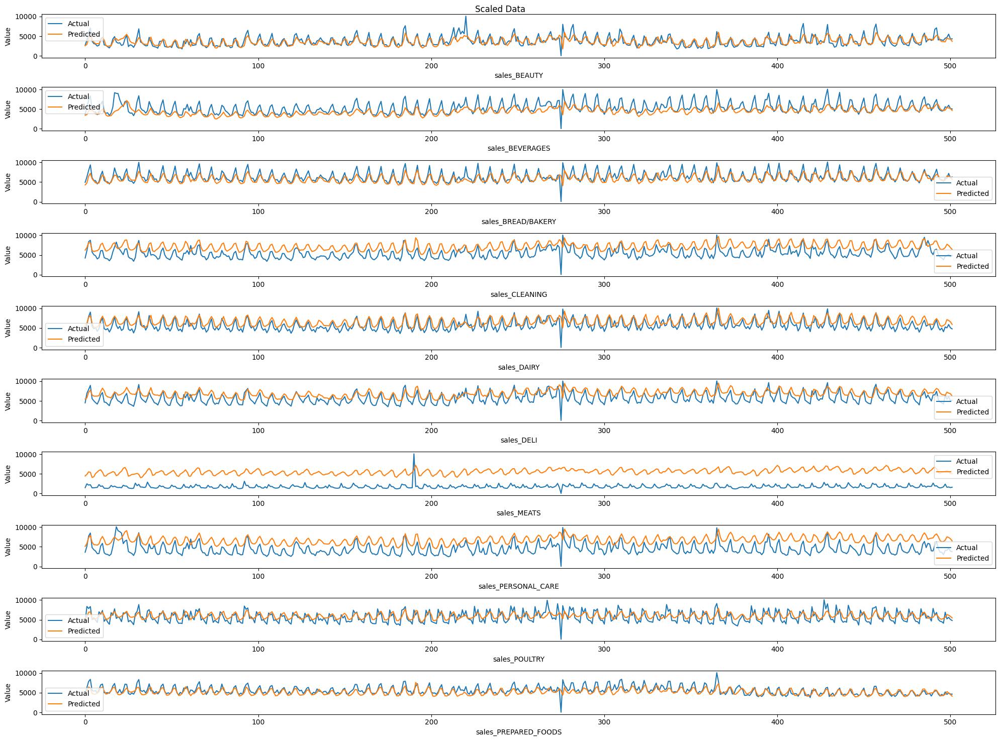

In [ ]:
plt.figure(figsize=(20, 15))
for i in range(n_features):
    plt.subplot(n_features, 1, i+1)
    plt.plot(originY[:, i], label='Actual')
    plt.plot(unscaled_CNN_LSTM[:, i], label='Predicted')
    plt.title('')
    plt.xlabel(f'{scaled_test.columns[i]}')
    plt.ylabel('Value')
    plt.legend()
    
plt.suptitle('Scaled Data')
plt.tight_layout()
plt.show()

## VAR-NN
### Define model

In [86]:
def to_sequences_multivariate(dataset, p):
    x = []
    y = []
    for i in range(p, len(dataset)):
        x.append(dataset.iloc[i - p:i, 0:dataset.shape[1]])
        y.append(dataset.iloc[i:i + 1, 0:dataset.shape[1]])
    x = np.array(x)
    y = np.array(y)
    return x,y.reshape(y.shape[0], y.shape[2])

In [87]:
p = 14

trainX, trainY = to_sequences_multivariate(scaled_train, p)
testX, testY = to_sequences_multivariate(scaled_test, p)

In [88]:
class VARNN(tf.keras.Model):
    def __init__(self, ffnn_model, var_model):
        super(VARNN, self).__init__()
        self.ffnn_model = ffnn_model
        self.var_model = var_model

    def call(self, inputs):
        ffnn_output = self.ffnn_model(inputs)
        var_output = self.var_model(ffnn_output)
        return var_output

In [89]:
num_outputs = 10
ffnn_model = tf.keras.models.Sequential([
    tf.keras.layers.Flatten(input_shape=(p, 10)),
    tf.keras.layers.Dense(50, activation='sigmoid'),
])
var_model = tf.keras.layers.Dense(num_outputs)

In [90]:
VARNN_model = VARNN(ffnn_model, var_model)
start = time.time()
VARNN_model.compile(optimizer='adam', loss='mse')
history = VARNN_model.fit(trainX, trainY, verbose=0, epochs=100, batch_size=32, validation_split=0.2)
end = time.time()

In [91]:
print(end-start)

9.817785263061523


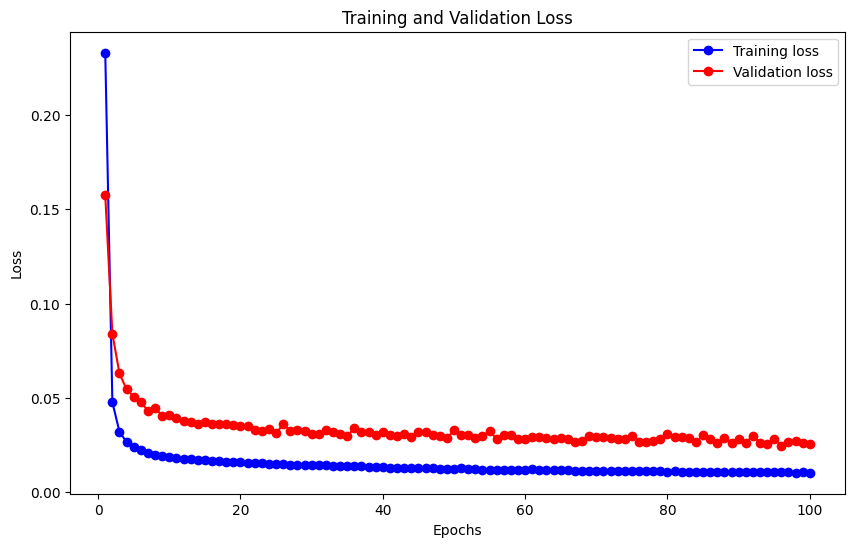

In [92]:
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(loss) + 1)

plt.figure(figsize=(10, 6))
plt.plot(epochs, loss, 'bo-', label='Training loss')
plt.plot(epochs, val_loss, 'ro-', label='Validation loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [93]:
pred_VARNN = VARNN_model.predict(testX)

9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 


### Model Evaluation
#### Scaled data


In [94]:
for i in range(10):
    print(f'MSE for {scaled_test.columns[i]}: {mean_squared_error(testY[:, i], pred_VARNN[:, i])}')
    
print(f'MSE total: {mean_squared_error(testY, pred_VARNN)}')

MSE for sales_BEAUTY: 0.05622529210180561
MSE for sales_BEVERAGES: 0.02269245698485418
MSE for sales_BREAD/BAKERY: 0.01961656978797435
MSE for sales_CLEANING: 0.03618433073830302
MSE for sales_DAIRY: 0.03717430497896042
MSE for sales_DELI: 0.02608260099357807
MSE for sales_MEATS: 0.19529460180206834
MSE for sales_PERSONAL_CARE: 0.04569721682080193
MSE for sales_POULTRY: 0.02221891815677258
MSE for sales_PREPARED_FOODS: 0.02552589162643886
MSE total: 0.04867121839915572


In [95]:
for i in range(10):
    print(f'RMSE for {scaled_test.columns[i]}: {mean_squared_error(testY[:, i], pred_VARNN[:, i], squared=False)}')
    
print(f'RMSE total: {mean_squared_error(testY, pred_VARNN, squared=False)}')

RMSE for sales_BEAUTY: 0.2371187299683549
RMSE for sales_BEVERAGES: 0.15064015727837707
RMSE for sales_BREAD/BAKERY: 0.14005916531228632
RMSE for sales_CLEANING: 0.1902217935419152
RMSE for sales_DAIRY: 0.19280639247431713
RMSE for sales_DELI: 0.16150108666376853
RMSE for sales_MEATS: 0.4419214882782555
RMSE for sales_PERSONAL_CARE: 0.2137690735836265
RMSE for sales_POULTRY: 0.1490601159156016
RMSE for sales_PREPARED_FOODS: 0.15976824348549012
RMSE total: 0.2036866246501993


In [96]:
for i in range(10):
    print(f'MAE for {scaled_test.columns[i]}: {mean_absolute_error(testY[:, i], pred_VARNN[:, i])}')
    
print(f'MAE total: {mean_absolute_error(testY, pred_VARNN)}')

MAE for sales_BEAUTY: 0.1630900980384201
MAE for sales_BEVERAGES: 0.10198096726159407
MAE for sales_BREAD/BAKERY: 0.10063200168821311
MAE for sales_CLEANING: 0.13181865733039114
MAE for sales_DAIRY: 0.13993378648097468
MAE for sales_DELI: 0.1172172930748795
MAE for sales_MEATS: 0.16709662611469067
MAE for sales_PERSONAL_CARE: 0.14122305721385756
MAE for sales_POULTRY: 0.11144354308574202
MAE for sales_PREPARED_FOODS: 0.11344014673658706
MAE total: 0.128787617702535


In [97]:
for i in range(10):
    print(f'R2 for {scaled_test.columns[i]}: {r2_score(testY[:, i], pred_VARNN[:, i])}')
    
print(f'R2 total: {r2_score(testY, pred_VARNN)}')

R2 for sales_BEAUTY: 0.5632537998499756
R2 for sales_BEVERAGES: 0.7550545685303268
R2 for sales_BREAD/BAKERY: 0.6782672247219634
R2 for sales_CLEANING: 0.5321621465965924
R2 for sales_DAIRY: 0.6222662785238651
R2 for sales_DELI: 0.6234259021187609
R2 for sales_MEATS: 0.21062070224724483
R2 for sales_PERSONAL_CARE: 0.5844231859641689
R2 for sales_POULTRY: 0.5457603538727407
R2 for sales_PREPARED_FOODS: 0.4443914640791773
R2 total: 0.5559625626504816


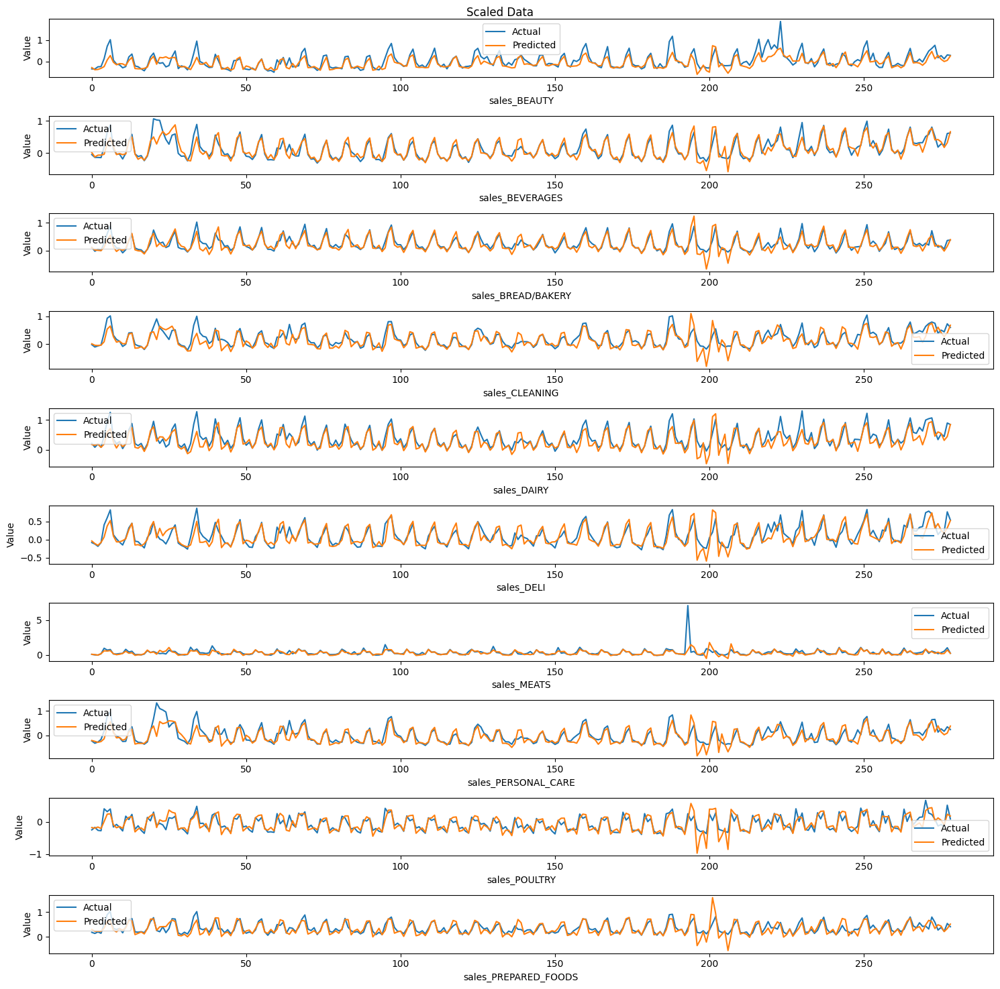

In [98]:
plt.figure(figsize=(15, 15))
for i in range(10):
    plt.subplot(10, 1, i+1)
    plt.plot(testY[:, i], label='Actual')
    plt.plot(pred_VARNN[:, i], label='Predicted')
    plt.title('')
    plt.xlabel(f'{scaled_test.columns[i]}')
    plt.ylabel('Value')
    plt.legend()
    
plt.suptitle('Scaled Data')
plt.tight_layout()
plt.show()

#### Unscaled data


In [99]:
unscaled_VARNN = unscale(pred_VARNN)
originY = unscale(testY)

In [100]:
for i in range(10):
    print(f'MSE for {scaled_test.columns[i]}: {mean_squared_error(originY[:, i], unscaled_VARNN[:, i])}')
    
print(f'MSE total: {mean_squared_error(originY, unscaled_VARNN)}')

MSE for sales_BEAUTY: 4267.513627391572
MSE for sales_BEVERAGES: 505036904.8807682
MSE for sales_BREAD/BAKERY: 10115319.51363138
MSE for sales_CLEANING: 98000549.68763462
MSE for sales_DAIRY: 43262153.64145878
MSE for sales_DELI: 5241616.303651335
MSE for sales_MEATS: 39228546.15847277
MSE for sales_PERSONAL_CARE: 13065486.796718528
MSE for sales_POULTRY: 10603837.644967968
MSE for sales_PREPARED_FOODS: 433221.2690555655
MSE total: 72499190.34099866


In [101]:
for i in range(10):
    print(f'RMSE for {scaled_test.columns[i]}: {mean_squared_error(originY[:, i], unscaled_VARNN[:, i], squared=False)}')
    
print(f'RMSE total: {mean_squared_error(originY, unscaled_VARNN, squared=False)}')

RMSE for sales_BEAUTY: 65.32620934503679
RMSE for sales_BEVERAGES: 22473.026162063004
RMSE for sales_BREAD/BAKERY: 3180.45900989643
RMSE for sales_CLEANING: 9899.522699990875
RMSE for sales_DAIRY: 6577.397178326604
RMSE for sales_DELI: 2289.457643995917
RMSE for sales_MEATS: 6263.269606082175
RMSE for sales_PERSONAL_CARE: 3614.6212521809985
RMSE for sales_POULTRY: 3256.353427527173
RMSE for sales_PREPARED_FOODS: 658.1954641712183
RMSE total: 5827.762865357943


In [102]:
for i in range(10):
    print(f'MAE for {scaled_test.columns[i]}: {mean_absolute_error(originY[:, i], unscaled_VARNN[:, i])}')
    
print(f'MAE total: {mean_absolute_error(originY, unscaled_VARNN)}')

MAE for sales_BEAUTY: 44.93132106548569
MAE for sales_BEVERAGES: 15213.877716173834
MAE for sales_BREAD/BAKERY: 2285.148165844534
MAE for sales_CLEANING: 6860.106476814516
MAE for sales_DAIRY: 4773.701199876792
MAE for sales_DELI: 1661.68555959543
MAE for sales_MEATS: 2368.228854721864
MAE for sales_PERSONAL_CARE: 2387.9406764532932
MAE for sales_POULTRY: 2434.585243701095
MAE for sales_PREPARED_FOODS: 467.3381134649418
MAE total: 3849.754332771179


## SrVAR
### Define model

In [ ]:
class LSTMEncoder(nn.Module):
    def __init__(self, input_dim, hidden_dim):
        super(LSTMEncoder, self).__init__()
        self.lstm = nn.LSTM(input_dim, hidden_dim, batch_first=True)

    def forward(self, x):
        _, (h_n, _) = self.lstm(x)
        return h_n[-1]  # Vector trạng thái cuối

In [ ]:
class StateRegularizedUnit(nn.Module):
    def __init__(self, hidden_dim, num_states, tau=1.0):
        super(StateRegularizedUnit, self).__init__()
        self.state_encodings = nn.Parameter(torch.randn(num_states, hidden_dim))
        self.tau = tau

    def forward(self, u_t):
        # Tính điểm gần gũi (Proximity scores)
        proximity_scores = torch.matmul(u_t, self.state_encodings.T)  # Công thức (2) 
        alpha = torch.softmax(proximity_scores / self.tau, dim=-1)  # Công thức (4) 

        # Tính trạng thái h_t dựa trên phân phối alpha
        h_t = torch.matmul(alpha, self.state_encodings)  # Công thức (5)

        # Tính entropy regularization
        entropy_reg = -torch.sum(alpha * torch.log(alpha + 1e-10), dim=-1).mean() # Công thức (6)

        return h_t, alpha, entropy_reg

In [ ]:
class GraphGeneration(nn.Module):
    def __init__(self, hidden_dim, num_vars):
        super(GraphGeneration, self).__init__()
        self.g_a = nn.Linear(hidden_dim, num_vars * num_vars)
        self.g_d = nn.Linear(hidden_dim, num_vars)

    def forward(self, c_st):
        # Sinh ma trận DAG (Adjacency matrix A_st)
        A_st = self.g_a(c_st).view(-1, num_vars, num_vars)  # Công thức (10)

        # Sinh ma trận time-lagged (Diagonal matrix D_st)
        D_st = torch.diag_embed(self.g_d(c_st))  # Công thức (11)

        # Ràng buộc tính không chu kỳ (Acyclicity constraint)
        exp_A = torch.matrix_exp(A_st * A_st)  # Tính ma trận mũ của A_st * A_st, nếu có chu kì thì exp_A sẽ cao [batch_size, num_vars, num_vars]
        trace_exp_A = torch.sum(torch.diagonal(exp_A, dim1=-2, dim2=-1), dim=-1)  # Tính trace cho từng ma trận trong batch [batch_size,] = torch.trace
        acyclic_penalty = torch.mean(trace_exp_A - A_st.size(-1))  # Tổng hợp thành scalar [batch_sỉze]

        return A_st, D_st, acyclic_penalty

In [ ]:
class DynamicVAR(nn.Module):
    def __init__(self, num_vars):
        super(DynamicVAR, self).__init__()
        self.var_weights = nn.Parameter(torch.randn(num_vars, num_vars))

    def forward(self, x_t, A_st, D_st):
        batch_size = x_t.size(0)
        x_t = x_t.unsqueeze(-1)

        # Tính toán từ ma trận adjacency (x_hat_A)
        x_hat_A = torch.matmul(A_st, x_t).squeeze(-1)

        # Tính toán từ ma trận time-lagged (x_hat_D)
        weighted_x_t = torch.matmul(self.var_weights, x_t.squeeze(-1).unsqueeze(-1)).squeeze(-1)
        x_hat_D = torch.matmul(D_st, weighted_x_t.unsqueeze(-1)).squeeze(-1)

        # Tổng hợp dự đoán
        x_hat = x_hat_A + x_hat_D
        return x_hat

In [ ]:
class SrVARModel(nn.Module):
    def __init__(self, input_dim, hidden_dim, num_states, num_vars, tau=10.0):
        super(SrVARModel, self).__init__()
        self.encoder = LSTMEncoder(input_dim, hidden_dim)
        self.state_regularized_unit = StateRegularizedUnit(hidden_dim, num_states, tau)
        self.graph_generation = GraphGeneration(hidden_dim, num_vars)
        self.dynamic_var = DynamicVAR(num_vars)

    def forward(self, x):
        u_t = self.encoder(x)  # Bước 1
        h_t, alpha, entropy_reg = self.state_regularized_unit(u_t)  # Bước 2
        A_st, D_st, acyclic_penalty = self.graph_generation(h_t)  # Bước 3
        x_hat = self.dynamic_var(x[:, -1, :], A_st, D_st)  # Bước 4

        return x_hat, alpha, entropy_reg, acyclic_penalty

In [ ]:
def train_srvarm(model, trainX, trainY, valX, valY, num_epochs=100, batch_size=32, lr=0.001, tau=1.0, verbose=0):

    # Optimizer và Loss function
    optimizer = optim.Adam(model.parameters(), lr=lr)
    mse_loss = nn.MSELoss()

    # Lagrangian parameters
    rho = 1.0
    lagrangian_multiplier = 0.0
    max_rho = 10.0

    # Lưu lịch sử mất mát
    train_loss_history = []
    val_loss_history = []

    for epoch in range(num_epochs):
        model.train()
        train_epoch_loss = 0

        # Huấn luyện
        for i in range(0, len(trainX), batch_size):
            # Lấy batch và chuyển về device
            batch_x = torch.tensor(trainX[i:i + batch_size], dtype=torch.float32)
            batch_y = torch.tensor(trainY[i:i + batch_size], dtype=torch.float32)

            # Forward pass
            x_hat, alpha, entropy_reg, acyclic_penalty = model(batch_x)

            # Tính hàm mất mát
            loss = (
                mse_loss(x_hat, batch_y)
                + 0.01 * entropy_reg
                + rho / 2 * acyclic_penalty.pow(2).mean()
                + lagrangian_multiplier * acyclic_penalty.mean()
            )

            # Backward pass và update
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            train_epoch_loss += loss.item()

        # Tính mất mát trung bình trên tập huấn luyện
        train_avg_loss = train_epoch_loss / (len(trainX) / batch_size)
        train_loss_history.append(train_avg_loss)

        # Đánh giá trên tập validation
        model.eval()
        val_epoch_loss = 0
        with torch.no_grad():
            for i in range(0, len(valX), batch_size):
                batch_val_x = torch.tensor(valX[i:i + batch_size], dtype=torch.float32)
                batch_val_y = torch.tensor(valY[i:i + batch_size], dtype=torch.float32)

                # Forward pass
                x_hat, alpha, entropy_reg, acyclic_penalty = model(batch_val_x)

                # Tính hàm mất mát validation
                val_loss = mse_loss(x_hat, batch_val_y) + 0.01 * entropy_reg
                val_epoch_loss += val_loss.item()

        # Tính mất mát trung bình trên tập validation
        val_avg_loss = val_epoch_loss / (len(valX) / batch_size)
        val_loss_history.append(val_avg_loss)

        # Log thông tin
        if verbose == 1:
            if (epoch + 1) % 10 == 0:
                print(f"Epoch {epoch + 1}/{num_epochs}, Train Loss: {train_avg_loss:.4f}, Val Loss: {val_avg_loss:.4f}")

    return model, train_loss_history, val_loss_history

In [ ]:
# Chia dữ liệu thành train và validation
Xtrain, valX, Ytrain, valY = train_test_split(trainX, trainY, test_size=0.2, random_state=42)

input_dim = trainX.shape[2]
hidden_dim = 64
num_vars = trainX.shape[2]

for num_states in range(1, 6):
    model = SrVARModel(input_dim=input_dim, hidden_dim=hidden_dim, num_states=num_states, num_vars=num_vars)
    trained_model_SrVAR, train_loss_history_SrVAR, val_loss_history_SrVAR = train_srvarm(
        model, Xtrain, Ytrain, valX, valY, num_epochs=100, batch_size=32, lr=0.001, tau=1.0, verbose=0
    )

    print(f"num_states: {num_states}, train_loss: {train_loss_history_SrVAR[-1]}, val_loss: {val_loss_history_SrVAR[-1]}")

num_states: 1, train_loss: 0.04018040932916742, val_loss: 0.0385795808457709
num_states: 2, train_loss: 0.019705262305547977, val_loss: 0.02453906801871923
num_states: 3, train_loss: 0.01753522799565242, val_loss: 0.022228855591315728
num_states: 4, train_loss: 0.021423264611451883, val_loss: 0.027506563183549163
num_states: 5, train_loss: 0.016593816414685318, val_loss: 0.01915720956666129


In [ ]:
# Model parameters
num_states = 5

# Instantiate the model
model_SrVAR = SrVARModel(input_dim=input_dim, hidden_dim=hidden_dim, num_states=num_states, num_vars=num_vars)

start = time.time()
trained_model_SrVAR, train_loss_history_SrVAR, val_loss_history_SrVAR = train_srvarm(
    model_SrVAR, Xtrain, Ytrain, valX, valY, num_epochs=100, batch_size=32, lr=0.01, tau=1.0, verbose=1
)
end = time.time()

# Log training time
print(f"Training completed in {end - start:.2f} seconds")

Epoch 10/100, Train Loss: 0.0369, Val Loss: 0.0385
Epoch 20/100, Train Loss: 0.0314, Val Loss: 0.0319
Epoch 30/100, Train Loss: 0.0258, Val Loss: 0.0322
Epoch 40/100, Train Loss: 0.0236, Val Loss: 0.0340
Epoch 50/100, Train Loss: 0.0233, Val Loss: 0.0311
Epoch 60/100, Train Loss: 0.0206, Val Loss: 0.0302
Epoch 70/100, Train Loss: 0.0214, Val Loss: 0.0299
Epoch 80/100, Train Loss: 0.0187, Val Loss: 0.0293
Epoch 90/100, Train Loss: 0.0183, Val Loss: 0.0282
Epoch 100/100, Train Loss: 0.0156, Val Loss: 0.0253
Training completed in 22.63 seconds


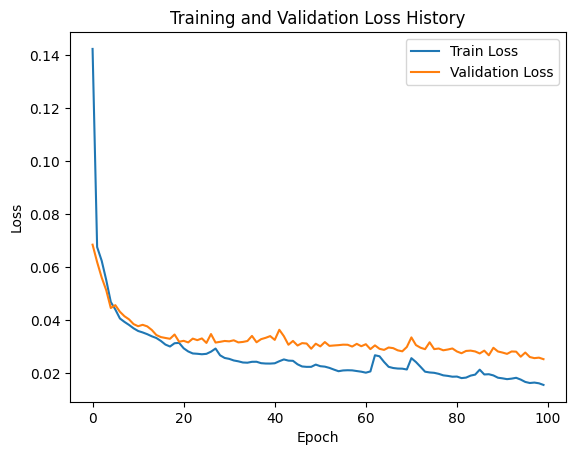

In [ ]:
plt.plot(train_loss_history_SrVAR, label="Train Loss")
plt.plot(val_loss_history_SrVAR, label="Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training and Validation Loss History")
plt.legend()
plt.show()

In [ ]:
model_SrVAR.eval()  # Đặt mô hình ở chế độ đánh giá
predictions_SrVAR = []
batch_size = 32
n_features = 10

with torch.no_grad():  # Không cần tính gradient trong chế độ dự đoán
    for i in range(0, len(testX), batch_size):
        # Lấy batch từ testX và chuyển về device
        batch_x = torch.tensor(testX[i:i+batch_size], dtype=torch.float32)

        # Dự đoán với mô hình
        batch_pred, _, _, _ = model_SrVAR(batch_x)  # Nếu forward của model trả về nhiều giá trị

        # Chuyển kết quả về CPU và thêm vào danh sách predictions
        predictions_SrVAR.append(batch_pred.cpu().numpy())

# Kết hợp danh sách predictions thành một mảng numpy
predictions_SrVAR = np.concatenate(predictions_SrVAR, axis=0)

### Model Evaluation
#### Scaled data


In [ ]:
for i in range(n_features):
    print(f'MSE for {scaled_test.columns[i]}: {mean_squared_error(testY[:, i], predictions_SrVAR[:, i])}')
    
print(f'MSE total: {mean_squared_error(testY, predictions_SrVAR)}')

MSE for sales_BEAUTY: 0.05846008812134472
MSE for sales_BEVERAGES: 0.02539116571900611
MSE for sales_BREAD/BAKERY: 0.025011587382149446
MSE for sales_CLEANING: 0.04370360736146784
MSE for sales_DAIRY: 0.03365515205190016
MSE for sales_DELI: 0.032326630053450475
MSE for sales_MEATS: 0.2117052505392871
MSE for sales_PERSONAL_CARE: 0.04728742429743492
MSE for sales_POULTRY: 0.02482566465077704
MSE for sales_PREPARED_FOODS: 0.04218103833434953
MSE total: 0.05445476085111674


In [ ]:
for i in range(n_features):
    print(f'RMSE for {scaled_test.columns[i]}: {mean_squared_error(testY[:, i], predictions_SrVAR[:, i], squared=False)}')
    
print(f'RMSE total: {mean_squared_error(testY, predictions_SrVAR, squared=False)}')

RMSE for sales_BEAUTY: 0.24178521071675316
RMSE for sales_BEVERAGES: 0.15934605649028816
RMSE for sales_BREAD/BAKERY: 0.1581505212832049
RMSE for sales_CLEANING: 0.20905407760067213
RMSE for sales_DAIRY: 0.1834534056699416
RMSE for sales_DELI: 0.17979607908252748
RMSE for sales_MEATS: 0.4601143885375539
RMSE for sales_PERSONAL_CARE: 0.2174567182163727
RMSE for sales_POULTRY: 0.15756162175725738
RMSE for sales_PREPARED_FOODS: 0.20538022868413972
RMSE total: 0.2172098308038711


In [ ]:
for i in range(n_features):
    print(f'MAE for {scaled_test.columns[i]}: {mean_absolute_error(testY[:, i], predictions_SrVAR[:, i])}')
    
print(f'MAE total: {mean_absolute_error(testY, predictions_SrVAR)}')

MAE for sales_BEAUTY: 0.1677914401383946
MAE for sales_BEVERAGES: 0.10929742773558933
MAE for sales_BREAD/BAKERY: 0.10342958992527476
MAE for sales_CLEANING: 0.1207980300025205
MAE for sales_DAIRY: 0.1347882715990749
MAE for sales_DELI: 0.12074088238828237
MAE for sales_MEATS: 0.1732892847894618
MAE for sales_PERSONAL_CARE: 0.13080341659761285
MAE for sales_POULTRY: 0.11607413576582692
MAE for sales_PREPARED_FOODS: 0.11275350545183939
MAE total: 0.12897659843938775


In [ ]:
for i in range(n_features):
    print(f'R2 for {scaled_test.columns[i]}: {r2_score(testY[:, i], predictions_SrVAR[:, i])}')
    
print(f'R2 total: {r2_score(testY, predictions_SrVAR)}')

R2 for sales_BEAUTY: 0.5458943761252073
R2 for sales_BEVERAGES: 0.7259243436393412
R2 for sales_BREAD/BAKERY: 0.5897831522256666
R2 for sales_CLEANING: 0.4349432078252842
R2 for sales_DAIRY: 0.6580249223595589
R2 for sales_DELI: 0.5332761654822719
R2 for sales_MEATS: 0.14428898464563888
R2 for sales_PERSONAL_CARE: 0.5699616190948653
R2 for sales_POULTRY: 0.49246848805707155
R2 for sales_PREPARED_FOODS: 0.08186772491450722
R2 total: 0.4776432984369414


#### Unscaled data


In [ ]:
unscaled_SrVAR = unscale(predictions_SrVAR)
originY = unscale(testY)

In [ ]:
for i in range(n_features):
    print(f'MSE for {scaled_test.columns[i]}: {mean_squared_error(originY[:, i], unscaled_SrVAR[:, i])}')
    
print(f'MSE total: {mean_squared_error(originY, unscaled_SrVAR)}')

MSE for sales_BEAUTY: 4437.13523454332
MSE for sales_BEVERAGES: 565098594.6613201
MSE for sales_BREAD/BAKERY: 12897268.801925765
MSE for sales_CLEANING: 118365531.33403523
MSE for sales_DAIRY: 39166685.865042165
MSE for sales_DELI: 6496429.516817087
MSE for sales_MEATS: 42524928.17243032
MSE for sales_PERSONAL_CARE: 13520149.775478438
MSE for sales_POULTRY: 11847890.168401828
MSE for sales_PREPARED_FOODS: 715889.6734975001
MSE total: 81063780.5104183


In [ ]:
for i in range(n_features):
    print(f'RMSE for {scaled_test.columns[i]}: {mean_squared_error(originY[:, i], unscaled_SrVAR[:, i], squared=False)}')
    
print(f'RMSE total: {mean_squared_error(originY, unscaled_SrVAR, squared=False)}')

RMSE for sales_BEAUTY: 66.61182503537431
RMSE for sales_BEVERAGES: 23771.80251182733
RMSE for sales_BREAD/BAKERY: 3591.2767648742647
RMSE for sales_CLEANING: 10879.592424996225
RMSE for sales_DAIRY: 6258.3293189989745
RMSE for sales_DELI: 2548.8094312476733
RMSE for sales_MEATS: 6521.114028479361
RMSE for sales_PERSONAL_CARE: 3676.9756288937297
RMSE for sales_POULTRY: 3442.076432678657
RMSE for sales_PREPARED_FOODS: 846.1026376849916
RMSE total: 6160.269100471659


In [ ]:
for i in range(n_features):
    print(f'MAE for {scaled_test.columns[i]}: {mean_absolute_error(originY[:, i], unscaled_SrVAR[:, i])}')
    
print(f'MAE total: {mean_absolute_error(originY, unscaled_SrVAR)}')

MAE for sales_BEAUTY: 46.22654054156341
MAE for sales_BEVERAGES: 16305.372759856631
MAE for sales_BREAD/BAKERY: 2348.6756944937274
MAE for sales_CLEANING: 6286.571012544803
MAE for sales_DAIRY: 4598.166960685484
MAE for sales_DELI: 1711.6362938015234
MAE for sales_MEATS: 2455.996235811918
MAE for sales_PERSONAL_CARE: 2211.7549773185483
MAE for sales_POULTRY: 2535.7446745552197
MAE for sales_PREPARED_FOODS: 464.5093825440188
MAE total: 3896.4654532153445


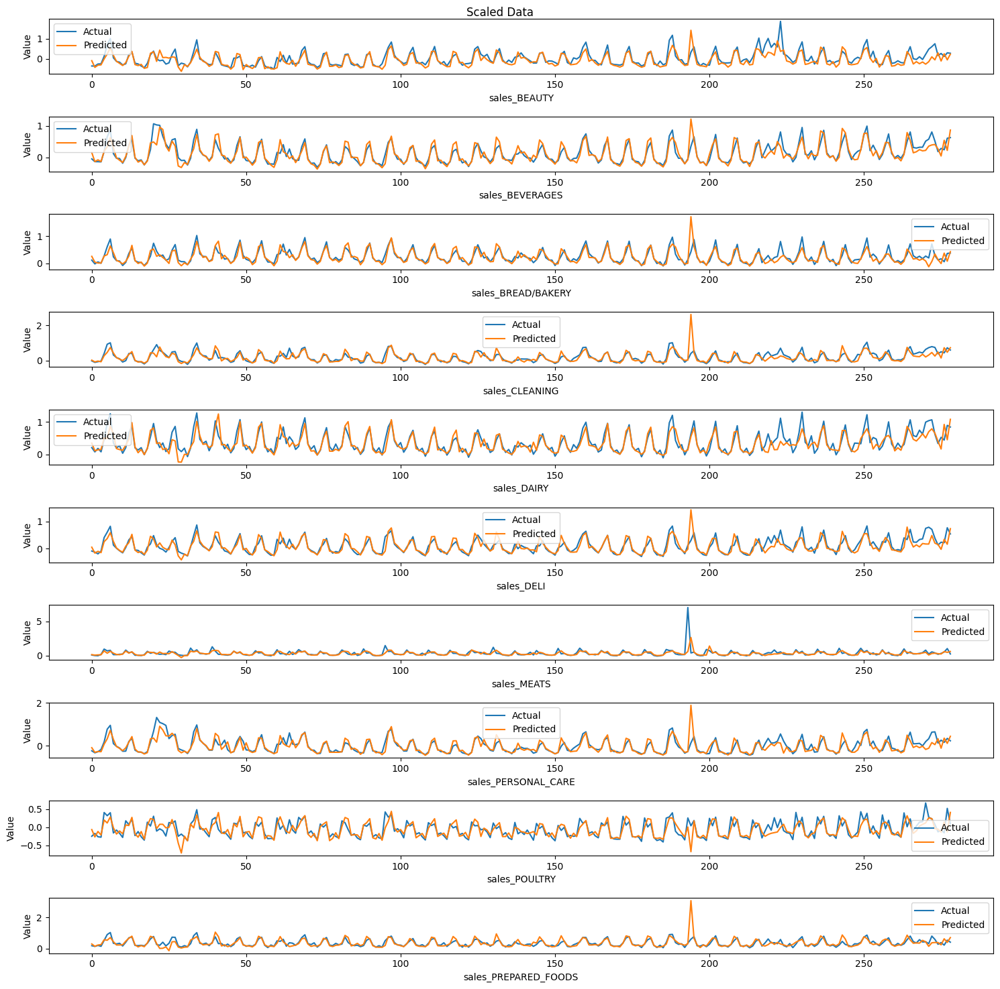

In [ ]:
plt.figure(figsize=(15, 15))
for i in range(n_features):
    plt.subplot(n_features, 1, i+1)
    plt.plot(testY[:, i], label='Actual')
    plt.plot(predictions_SrVAR[:, i], label='Predicted')
    plt.title('')
    plt.xlabel(f'{scaled_test.columns[i]}')
    plt.ylabel('Value')
    plt.legend()
    
plt.suptitle('Scaled Data')
plt.tight_layout()
plt.show()

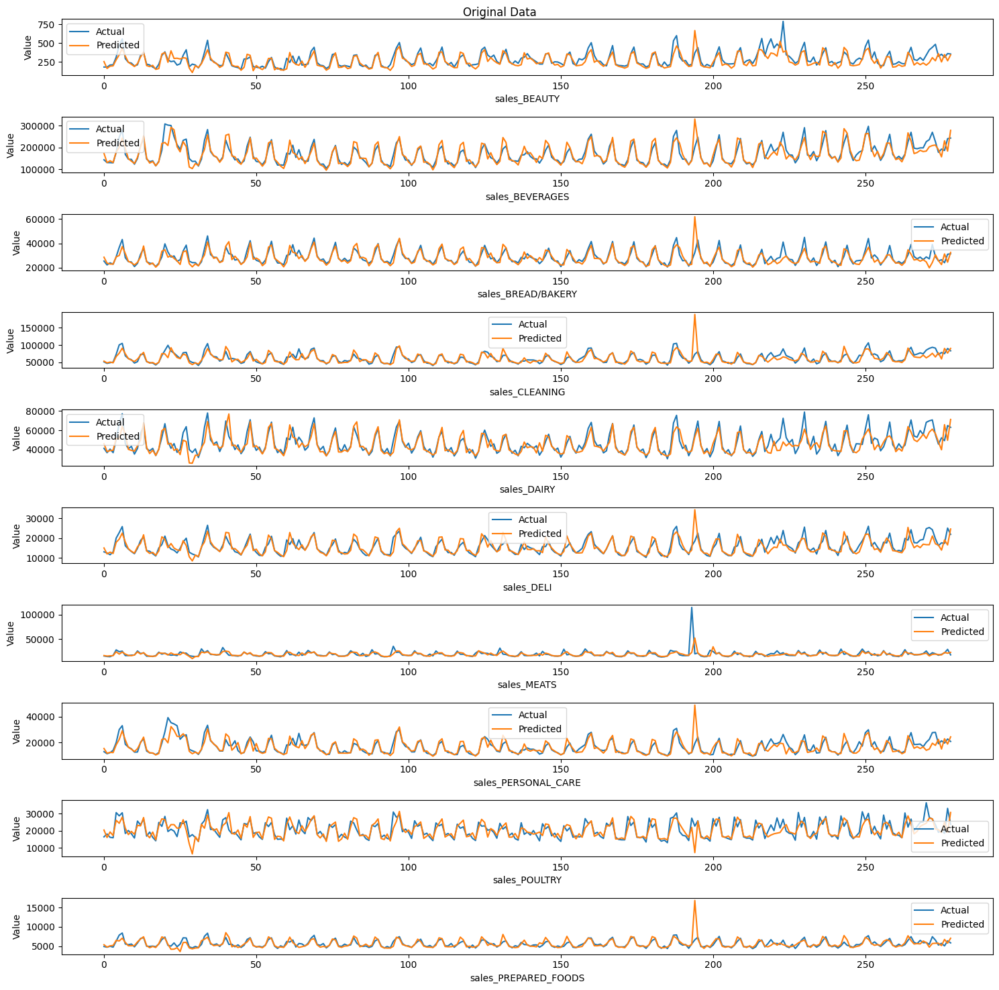

In [ ]:
plt.figure(figsize=(15, 15))
for i in range(n_features):
    plt.subplot(n_features, 1, i+1)
    plt.plot(originY[:, i], label='Actual')
    plt.plot(unscaled_SrVAR[:, i], label='Predicted')
    plt.title('')
    plt.xlabel(f'{scaled_test.columns[i]}')
    plt.ylabel('Value')
    plt.legend()
    
plt.suptitle('Original Data')
plt.tight_layout()
plt.show()